In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import shapely.geometry
import seaborn as sns
import plotly.express as px
import re
from matplotlib.colors import TwoSlopeNorm
import missingno as msno
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib as mpl
import math

In [2]:
import plotly.io as pio
pio.renderers.default = 'notebook_connected'
pd.set_option('display.max_columns', None)

In [3]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [15, 10]
plt.rcParams['figure.dpi'] = 200

In [4]:
# Projected Coordinate System: how you project onto a 2D plane
epsg_2d = 26717 
# Toronto Police Service Open Data includes geographic location information provided in
# the projected coordinate system NAD 1927 UTM 17N
# https://epsg.io/26717

# Geographic Coordinate System: how coordinates are represented in a 3D space
# World Geodetic System 1984 (WGS84)
# https://epsg.io/4326
epsg_3d = 4326 

# TTC station locations

In [59]:
stations_point = gpd.read_file('./clean_data/stations_point.geojson')
stations_area = gpd.read_file('./clean_data/stations_area.geojson')

In [60]:
# radius in km
radius = (stations_area.to_crs(epsg_2d)['geometry'].iloc[0].area / np.pi)**0.5 / 10**3

Text(0.5, 1.0, 'TTC subway stations with surrounding radius of 0.40km')

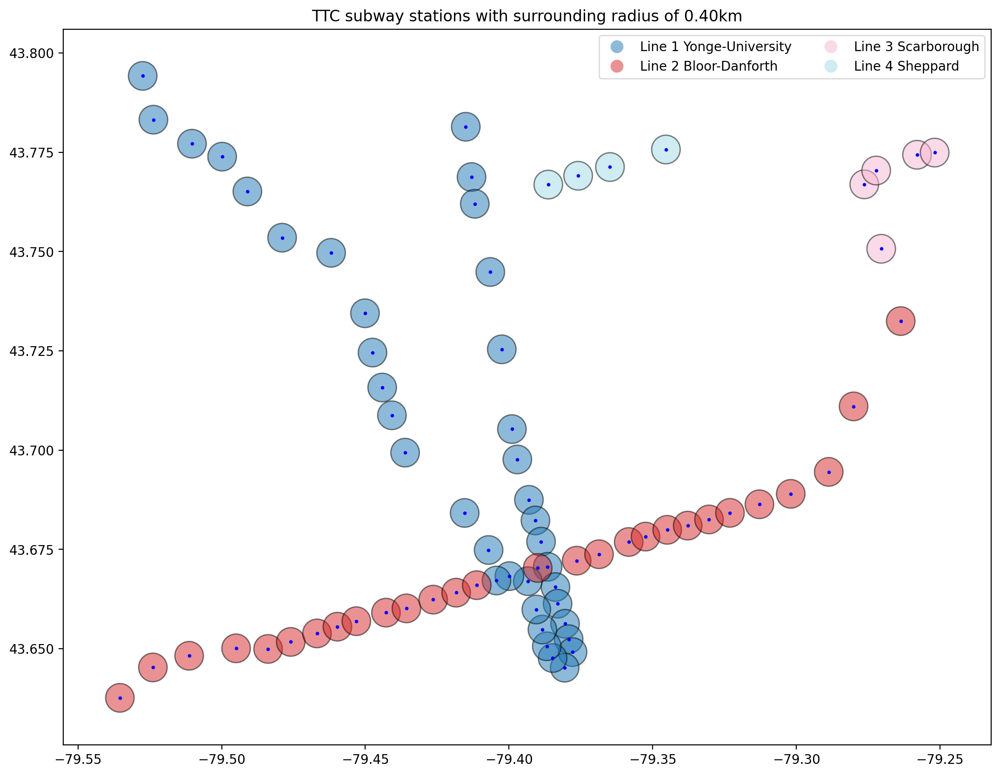

In [102]:
ax = stations_area.plot(column = 'line', 
                        edgecolor = 'black', 
                        alpha = 0.5,
                        cmap = 'tab20',
                        legend = True,
                        legend_kwds = {'loc': 'upper right', 
                                       'ncol': 2,
                                       'edgecolor': 'lightgrey'})
stations_point.plot(ax=ax, 
                    color = 'blue', 
                    markersize = 3)
plt.title(f'TTC subway stations with surrounding radius of {radius:0.2f}km')

# Neighbourhood population and distance from UofT

In [208]:
neighbourhoods = gpd.read_file('./clean_data/neighbourhoods.geojson')
neighbourhoods.head()

,Neighbourhood,Hood_ID,district,distance_km,Population_2014,Population_2015,Population_2016,Population_2017,Population_2018,Population_2019,Population_2020,PIC_Count2014,PIC_Count2015,PIC_Count2016,PIC_Count2017,PIC_Count2018,PIC_Count2019,PIC_Count2020,PIC_Density2014,PIC_Density2015,PIC_Density2016,PIC_Density2017,PIC_Density2018,PIC_Density2019,PIC_Density2020,PIC_Rate2014,PIC_Rate2015,PIC_Rate2016,PIC_Rate2017,PIC_Rate2018,PIC_Rate2019,PIC_Rate2020,MentalHealth_Count2014,MentalHealth_Count2015,MentalHealth_Count2016,MentalHealth_Count2017,MentalHealth_Count2018,MentalHealth_Count2019,MentalHealth_Count2020,MentalHealth_Density2014,MentalHealth_Density2015,MentalHealth_Density2016,MentalHealth_Density2017,MentalHealth_Density2018,MentalHealth_Density2019,MentalHealth_Density2020,MentalHealth_Rate2014,MentalHealth_Rate2015,MentalHealth_Rate2016,MentalHealth_Rate2017,MentalHealth_Rate2018,MentalHealth_Rate2019,MentalHealth_Rate2020,geometry
0,Yonge-St.Clair,97,C02,2.791462,12597,12746,12950,13214,13508,13789,14082,61.0,83.0,73.0,62.0,81.0,86.0,93.0,52.526545,71.470544,62.859635,53.387635,69.748363,74.053817,80.081453,484.242280,651.184685,563.706564,469.199334,599.644655,623.685546,660.417554,18.0,30.0,24.0,27.0,27.0,33.0,42.0,15.499636,25.832727,20.666181,23.249454,23.249454,28.416000,36.165818,142.891165,235.367959,185.328185,204.328742,199.881552,239.321198,298.253089,"POLYGON ((-79.39115 43.68108, -79.39137 43.680..."
1,York University Heights,27,W05,13.676191,28719,28612,28597,28981,29422,29847,30277,256.0,327.0,322.0,322.0,379.0,395.0,363.0,19.325509,24.685319,24.307867,24.307867,28.610813,29.818657,27.402968,891.395940,1142.877114,1125.992237,1111.072772,1288.151723,1323.416089,1198.929881,121.0,128.0,160.0,188.0,211.0,191.0,191.0,9.134323,9.662755,12.078443,14.192171,15.928447,14.418642,14.418642,421.323862,447.364742,559.499248,648.700873,717.150432,639.930311,630.841893,"POLYGON ((-79.50525 43.75987, -79.50484 43.759..."
2,Lansing-Westgate,38,C07,10.427749,16086,16376,16722,17053,17429,17784,18146,94.0,94.0,108.0,109.0,131.0,131.0,117.0,17.582755,17.582755,20.201463,20.388514,24.503627,24.503627,21.884919,584.359070,574.010747,645.855759,639.183721,751.620862,736.617184,644.770197,33.0,24.0,36.0,33.0,35.0,47.0,41.0,6.172669,4.489214,6.733821,6.172669,6.546771,8.791378,7.669074,205.147333,146.555936,215.285253,193.514338,200.814734,264.282501,225.945112,"POLYGON ((-79.43994 43.76156, -79.44000 43.761..."
3,Yorkdale-Glen Park,31,W04,7.592207,15196,15187,15228,15797,18722,16970,17560,146.0,131.0,154.0,173.0,192.0,216.0,227.0,24.178636,21.694530,25.503493,28.650028,31.796562,35.771133,37.592811,960.779152,862.579838,1011.294983,1095.144648,1025.531460,1272.834414,1292.710706,33.0,36.0,50.0,47.0,55.0,76.0,81.0,5.465034,5.961855,8.280355,7.783533,9.108390,12.586139,13.414175,217.162411,237.044841,328.342527,297.524846,293.772033,447.849146,461.275626,"POLYGON ((-79.43965 43.70561, -79.44007 43.705..."
4,Stonegate-Queensway,16,W07,9.017845,25636,25679,25782,26165,26601,27006,27409,145.0,129.0,127.0,122.0,150.0,131.0,146.0,18.247086,16.233614,15.981930,15.352721,18.876296,16.485298,18.372928,565.610860,502.356011,492.591731,466.271737,563.888576,485.077390,532.671750,54.0,59.0,45.0,41.0,47.0,41.0,47.0,6.795466,7.424676,5.662889,5.159521,5.914573,5.159521,5.914573,210.641286,229.759726,174.540377,156.697879,176.685087,151.818114,171.476522,"POLYGON ((-79.49258 43.64744, -79.49273 43.647..."


Text(0.5, 1.0, 'Distance in km from University of Toronto St. George campus')

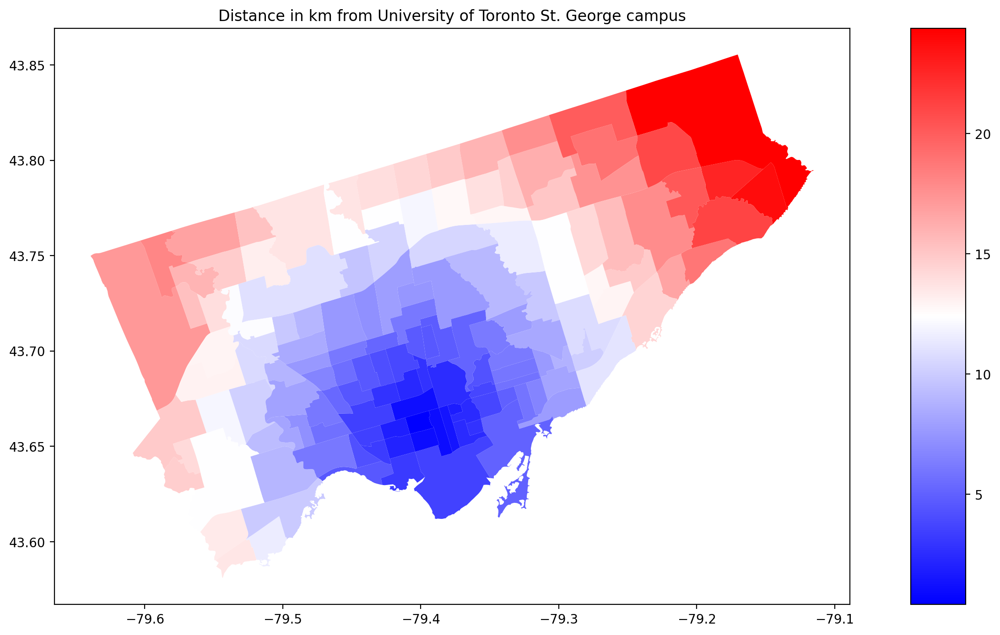

In [180]:
fig, ax = plt.subplots(1, 1)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=-1)
im2 = neighbourhoods.plot(column = 'distance_km', 
                         cmap = 'bwr',
                         legend = True,
                         ax = ax,
                         cax = cax)
ax.set_title('Distance in km from University of Toronto St. George campus')

In [27]:
counts = sorted(list(set([re.search('[a-zA-Z]+_Count', x).group(0) for x in neighbourhoods.columns.values if re.search('[a-zA-Z]+_Count', x) is not None])))
counts

['MentalHealth_Count', 'PIC_Count']

In [28]:
rates = sorted(list(set([re.search('[a-zA-Z]+_Rate', x).group(0) for x in neighbourhoods.columns.values if re.search('[a-zA-Z]+_Rate', x) is not None])))
rates

['MentalHealth_Rate', 'PIC_Rate']

In [29]:
desities = sorted(list(set([re.search('[a-zA-Z]+_Density', x).group(0) for x in neighbourhoods.columns.values if re.search('[a-zA-Z]+_Density', x) is not None])))
desities

['MentalHealth_Density', 'PIC_Density']

In [12]:
years = sorted(list(set([re.search('[0-9]+', x).group(0) for x in neighbourhoods.columns.values if re.search('[0-9]+', x) is not None])))
years

['2014', '2015', '2016', '2017', '2018', '2019', '2020']

In [13]:
population = sorted(list(set([re.search('Population_\d{4}', x).group(0) for x in neighbourhoods.columns.values if re.search('Population_\d{4}', x) is not None])))
population

['Population_2014',
 'Population_2015',
 'Population_2016',
 'Population_2017',
 'Population_2018',
 'Population_2019',
 'Population_2020']

In [186]:
def plot_one(var, title, row, col):
    fig, axes = plt.subplots(row, col)

    # fix the range for the colorbar so we can compare across years
    vmin, vmax = neighbourhoods[[var + str(year) for year in years]].min().min(), neighbourhoods[[var + str(year) for year in years]].max().max()
    norm = TwoSlopeNorm(vmin=vmin, vcenter= np.mean([vmin, vmax]), vmax=vmax)
    
    for ax in axes.flatten():
        ax.xaxis.set_visible(False)
        ax.set_yticks([])
    
    plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
    cax = plt.axes([0.85, 0.1, 0.05, 0.8])
    for year, ax in zip(years, axes.flatten()):
        neighbourhoods.plot(column = var + str(year), 
                            cmap = 'bwr',
                            norm = norm,
                            ax = ax, 
                            # cax = cax,
                            # legend = True,
                            )
        ax.set_title(year)

    fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='bwr'), cax=cax, orientation='vertical')
    
    fig.suptitle(title, size='xx-large')

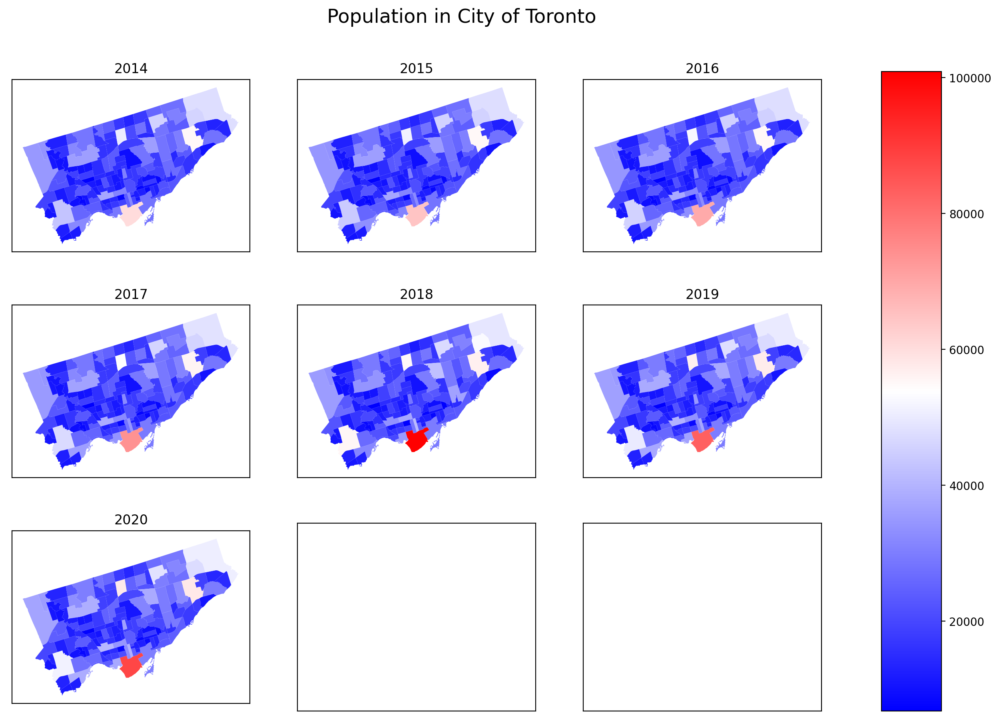

In [187]:
plot_one('Population_', 'Population in City of Toronto', 3, 3)

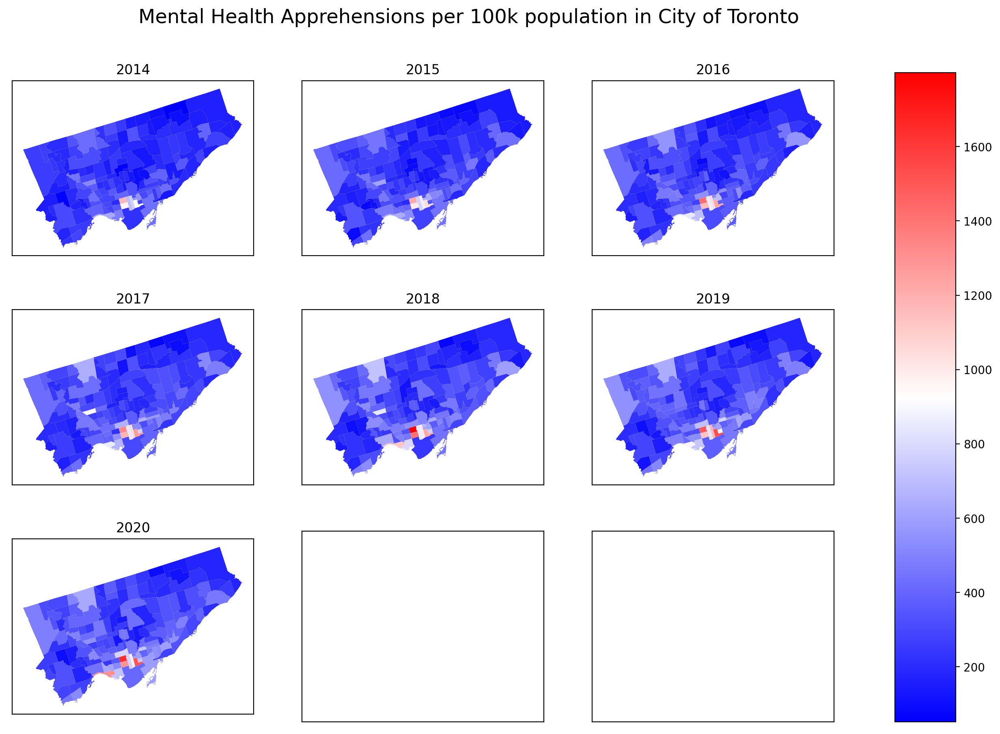

In [188]:
plot_one('MentalHealth_Rate', 'Mental Health Apprehensions per 100k population in City of Toronto', 3, 3)

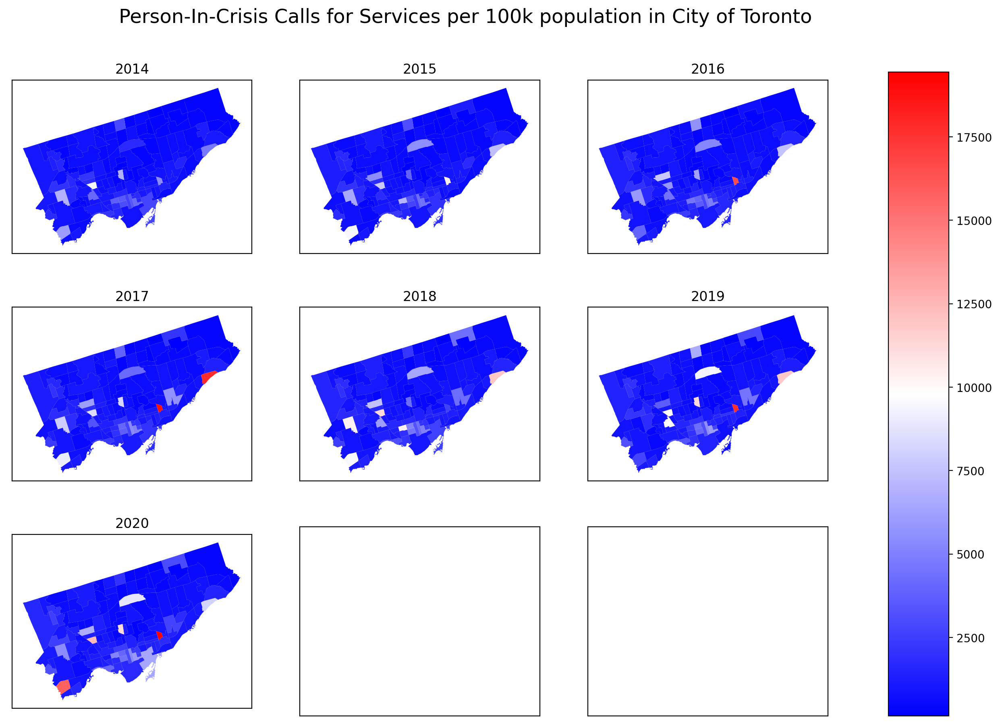

In [189]:
plot_one('PIC_Rate', 'Person-In-Crisis Calls for Services per 100k population in City of Toronto', 3, 3)

# Import TRREB rental transactions

In [86]:
rental = pd.read_csv("./clean_data/rental.csv")
rental

,district,All_Apartments_Listed,All_Apartments_Leased,Bachelor_Total_Leased,Bachelor_Avg_Lease_Rate,One_Bedroom_Total_Leased,One_Bedroom_Avg_Lease_Rate,Two_Bedroom_Total_Leased,Two_Bedroom_Avg_Lease_Rate,Three_Bedroom_Total_Leased,Three_Bedroom_Avg_Lease_Rate,Year,Quarter,YearQuarter,All_Apartments_Leased_vs_Listed,Bachelor_Total_Leased_Per_Room,Bachelor_Avg_Lease_Rate_Per_Room,One_Bedroom_Total_Leased_Per_Room,One_Bedroom_Avg_Lease_Rate_Per_Room,Two_Bedroom_Total_Leased_Per_Room,Two_Bedroom_Avg_Lease_Rate_Per_Room,Three_Bedroom_Total_Leased_Per_Room,Three_Bedroom_Avg_Lease_Rate_Per_Room
0,C01,2038.0,1194.0,59.0,1332.0,759.0,1666.0,370.0,2510.0,6.0,3194.0,2012,1,2012Q1,0.585868,59.0,1332.0,759.0,1666.0,740.0,1255.0,18.0,1064.666667
1,C01,2160.0,1350.0,78.0,1350.0,795.0,1739.0,453.0,2603.0,24.0,4321.0,2012,2,2012Q2,0.625000,78.0,1350.0,795.0,1739.0,906.0,1301.5,72.0,1440.333333
2,C01,2255.0,1408.0,50.0,1410.0,859.0,1802.0,476.0,2667.0,23.0,3891.0,2012,3,2012Q3,0.624390,50.0,1410.0,859.0,1802.0,952.0,1333.5,69.0,1297.000000
3,C01,1917.0,1012.0,37.0,1426.0,647.0,1844.0,319.0,2650.0,9.0,3717.0,2012,4,2012Q4,0.527908,37.0,1426.0,647.0,1844.0,638.0,1325.0,27.0,1239.000000
4,C01,2845.0,1350.0,62.0,1338.0,868.0,1758.0,404.0,2578.0,16.0,4719.0,2013,1,2013Q1,0.474517,62.0,1338.0,868.0,1758.0,808.0,1289.0,48.0,1573.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1395,W10,92.0,34.0,NaN,NaN,11.0,1850.0,20.0,2075.0,3.0,2300.0,2020,4,2020Q4,0.369565,NaN,NaN,11.0,1850.0,40.0,1037.5,9.0,766.666667
1396,W10,85.0,36.0,NaN,NaN,21.0,1764.0,13.0,2123.0,2.0,2225.0,2021,1,2021Q1,0.423529,NaN,NaN,21.0,1764.0,26.0,1061.5,6.0,741.666667
1397,W10,78.0,35.0,NaN,NaN,21.0,1748.0,14.0,2243.0,NaN,NaN,2021,2,2021Q2,0.448718,NaN,NaN,21.0,1748.0,28.0,1121.5,NaN,NaN
1398,W10,83.0,31.0,NaN,NaN,15.0,1839.0,15.0,2150.0,1.0,2350.0,2021,3,2021Q3,0.373494,NaN,NaN,15.0,1839.0,30.0,1075.0,3.0,783.333333


In [57]:
neighborhoods_rental = gpd.read_file('./clean_data/neighbourhoods_rental.geojson')
neighborhoods_rental

,Neighbourhood,Hood_ID,district,All_Apartments_Listed,All_Apartments_Leased,Year,Quarter,YearQuarter,All_Apartments_Leased_vs_Listed,One_Bedroom_Total_Leased_Per_Room,One_Bedroom_Avg_Lease_Rate_Per_Room,Two_Bedroom_Total_Leased_Per_Room,Two_Bedroom_Avg_Lease_Rate_Per_Room,Three_Bedroom_Total_Leased_Per_Room,Three_Bedroom_Avg_Lease_Rate_Per_Room,All_Apartments_Total_Leased_Per_Room,All_Apartments_Avg_Lease_Rate_Per_Room,geometry
0,Yonge-St.Clair,97,C02,179.0,92.0,2012,1,2012Q1,0.513966,45.0,2029.0,84.0,2052.0,3.0,1333.333333,132.0,2027.825758,"POLYGON ((-79.39115 43.68108, -79.39137 43.680..."
1,Yonge-St.Clair,97,C02,214.0,105.0,2012,2,2012Q2,0.490654,50.0,1939.0,90.0,1959.0,12.0,1991.666667,152.0,1955.000000,"POLYGON ((-79.39115 43.68108, -79.39137 43.680..."
2,Yonge-St.Clair,97,C02,234.0,107.0,2012,3,2012Q3,0.457265,57.0,2100.0,82.0,2009.5,12.0,2299.333333,151.0,2066.695364,"POLYGON ((-79.39115 43.68108, -79.39137 43.680..."
3,Yonge-St.Clair,97,C02,226.0,82.0,2012,4,2012Q4,0.362832,46.0,2115.0,58.0,1698.5,9.0,1466.666667,113.0,1849.584071,"POLYGON ((-79.39115 43.68108, -79.39137 43.680..."
4,Yonge-St.Clair,97,C02,273.0,95.0,2013,1,2013Q1,0.347985,41.0,2351.0,94.0,2123.5,9.0,1850.000000,144.0,2171.180556,"POLYGON ((-79.39115 43.68108, -79.39137 43.680..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5595,Mount Pleasant West,104,C10,1038.0,404.0,2020,4,2020Q4,0.389210,267.0,1828.0,242.0,1321.5,3.0,2000.000000,512.0,1589.607422,"POLYGON ((-79.39607 43.69566, -79.39616 43.696..."
5596,Mount Pleasant West,104,C10,970.0,416.0,2021,1,2021Q1,0.428866,281.0,1779.0,230.0,1278.0,12.0,1166.666667,523.0,1544.625239,"POLYGON ((-79.39607 43.69566, -79.39616 43.696..."
5597,Mount Pleasant West,104,C10,1064.0,608.0,2021,2,2021Q2,0.571429,409.0,1789.0,348.0,1270.0,12.0,1391.666667,769.0,1547.933680,"POLYGON ((-79.39607 43.69566, -79.39616 43.696..."
5598,Mount Pleasant West,104,C10,1031.0,767.0,2021,3,2021Q3,0.743938,501.0,1896.0,444.0,1334.5,12.0,1366.666667,957.0,1628.854754,"POLYGON ((-79.39607 43.69566, -79.39616 43.696..."


In [90]:
neighborhoods_rental.isna().sum()

Neighbourhood                             0
Hood_ID                                   0
district                                  0
All_Apartments_Listed                     0
All_Apartments_Leased                     0
Year                                      0
Quarter                                   0
YearQuarter                               0
All_Apartments_Leased_vs_Listed           0
One_Bedroom_Total_Leased_Per_Room         0
One_Bedroom_Avg_Lease_Rate_Per_Room       0
Two_Bedroom_Total_Leased_Per_Room         0
Two_Bedroom_Avg_Lease_Rate_Per_Room       0
Three_Bedroom_Total_Leased_Per_Room       0
Three_Bedroom_Avg_Lease_Rate_Per_Room     0
All_Apartments_Total_Leased_Per_Room      0
All_Apartments_Avg_Lease_Rate_Per_Room    0
geometry                                  0
dtype: int64

In [91]:
rental_years = neighborhoods_rental.Year.unique()
rental_quarters = neighborhoods_rental.Quarter.unique()

In [205]:
def plot_rental(var, title):
    fig, axes = plt.subplots(len(rental_quarters), len(rental_years))
    
    for j in range(axes.shape[1]):
        
        # due to inflation, rental rates in recent years must be higher than those in previous years
        # therefore, it would only make sense to fix the range for the colorbar 
        # such that we compare across quarters to observe seasonal effect (if any) in each year, but not across years
        # selected_period = neighborhoods_rental.loc[(neighborhoods_rental['Year'] == rental_years[j])]
        # vmin, vmax = selected_period[var].min(), selected_period[var].max()
        # norm = TwoSlopeNorm(vmin=vmin, vcenter= np.mean([vmin, vmax]), vmax=vmax)    
        
        for i in range(axes.shape[0]):         
            plot_df = neighborhoods_rental.loc[(neighborhoods_rental['Quarter'] == rental_quarters[i]) & (neighborhoods_rental['Year'] == rental_years[j])]
            plot_df.plot(column = var, 
                         cmap = 'bwr', 
                        #  norm = norm, 
                         ax = axes[i, j])
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].set_yticks([])
            if i == 0:
                axes[i,j].set_title(rental_years[j])
            if j == 0:
                axes[i,j].set_ylabel("Q" + str(rental_quarters[i]), rotation=90, size='large')

    fig.suptitle(title, size='xx-large')

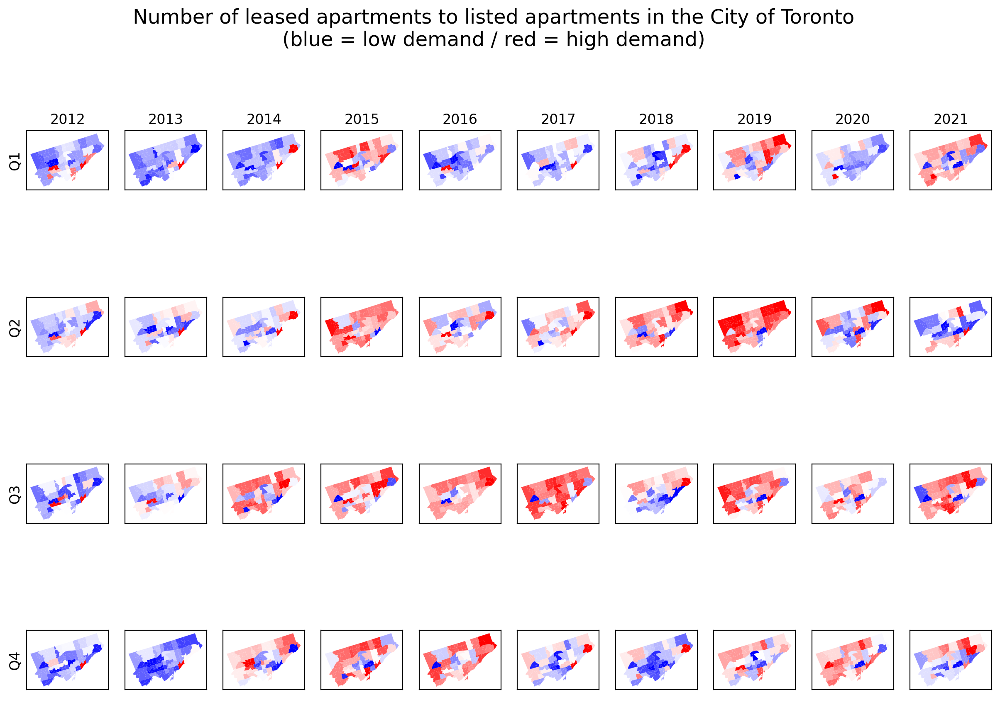

In [206]:
plot_rental('All_Apartments_Leased_vs_Listed', 
            'Number of leased apartments to listed apartments in the City of Toronto\n(blue = low demand / red = high demand)')

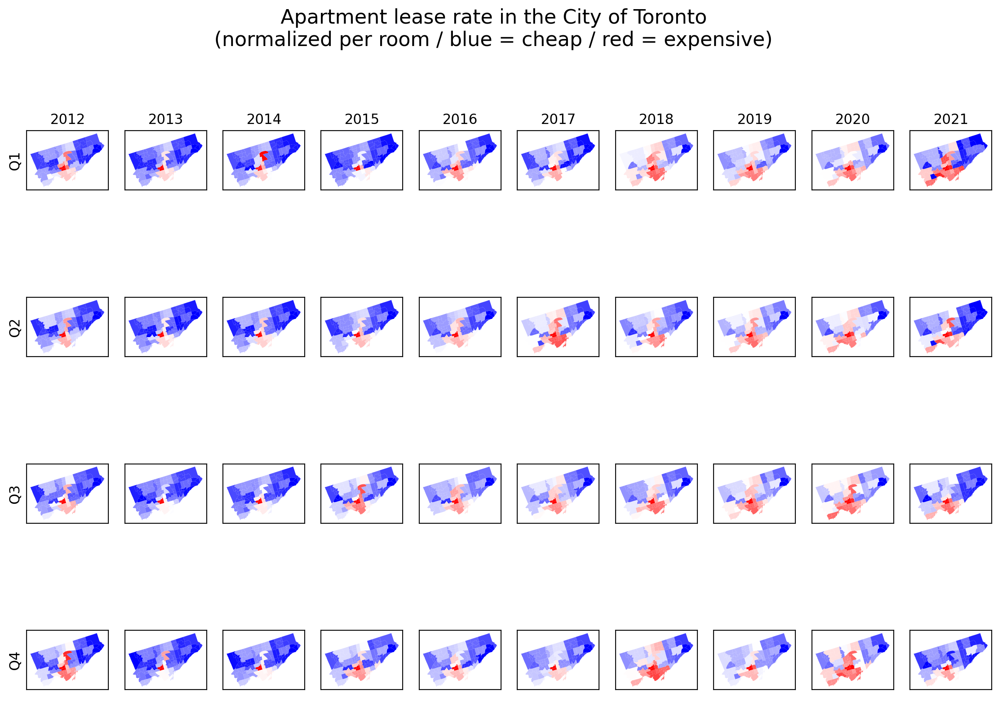

In [192]:
plot_rental('All_Apartments_Avg_Lease_Rate_Per_Room', 'Apartment lease rate in the City of Toronto\n(normalized per room / blue = cheap / red = expensive)')

In [95]:
neighborhoods_rental.columns

Index(['Neighbourhood', 'Hood_ID', 'district', 'All_Apartments_Listed',
       'All_Apartments_Leased', 'Year', 'Quarter', 'YearQuarter',
       'All_Apartments_Leased_vs_Listed', 'One_Bedroom_Total_Leased_Per_Room',
       'One_Bedroom_Avg_Lease_Rate_Per_Room',
       'Two_Bedroom_Total_Leased_Per_Room',
       'Two_Bedroom_Avg_Lease_Rate_Per_Room',
       'Three_Bedroom_Total_Leased_Per_Room',
       'Three_Bedroom_Avg_Lease_Rate_Per_Room',
       'All_Apartments_Total_Leased_Per_Room',
       'All_Apartments_Avg_Lease_Rate_Per_Room', 'geometry'],
      dtype='object')

Text(0.5, 1.0, 'Recovery in rental demand: ratio of leased to listed apartments has picked up in 2021')

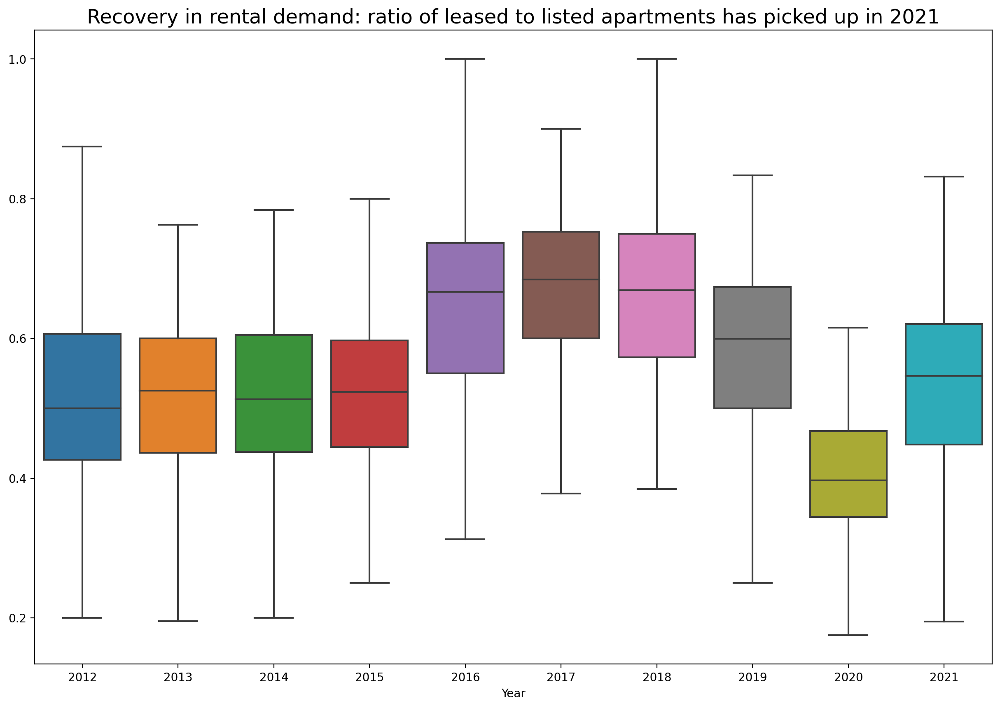

In [114]:
var = 'All_Apartments_Leased_vs_Listed'
title = 'Recovery in rental demand: ratio of leased to listed apartments has picked up in 2021'

ax = sns.boxplot(x='Year', y=var,data=neighborhoods_rental, 
            showfliers = False, # remove outliers
            )
ax.set_ylabel('')
ax.set_title(title, size='xx-large')

Text(0.5, 1.1, 'Lease rates for apartments have tapered off since the spike in 2019\n(normalized by number of rooms)')

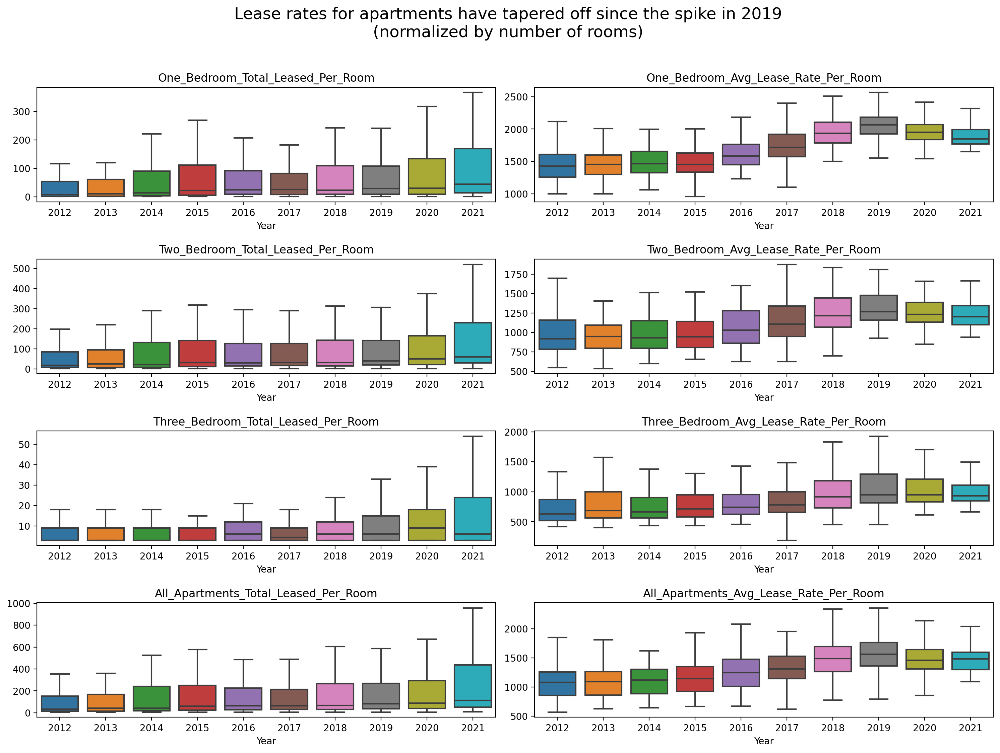

In [154]:
vars = ['One_Bedroom_Total_Leased_Per_Room',
       'One_Bedroom_Avg_Lease_Rate_Per_Room',
       'Two_Bedroom_Total_Leased_Per_Room',
       'Two_Bedroom_Avg_Lease_Rate_Per_Room',
       'Three_Bedroom_Total_Leased_Per_Room',
       'Three_Bedroom_Avg_Lease_Rate_Per_Room',
       'All_Apartments_Total_Leased_Per_Room',
       'All_Apartments_Avg_Lease_Rate_Per_Room']

fig, axes = plt.subplots(int(len(vars)/2),2)
fig.tight_layout()
plt.subplots_adjust(hspace=0.5)
for var, ax in zip(vars, axes.flatten()):
    sns.boxplot(x='Year', y=var,data=neighborhoods_rental, 
                showfliers = False, # remove outliers
                ax=ax)
    ax.set_ylabel('')
    ax.set_title(var)
    
fig.suptitle('Lease rates for apartments have tapered off since the spike in 2019\n(normalized by number of rooms)', 
             size='xx-large', y = 1.1)

Text(0.5, 1.1, 'Quarterly effect: lease rates are stable throughout the year despite strong demand in Q3 due to school season\n(normalized by number of rooms)')

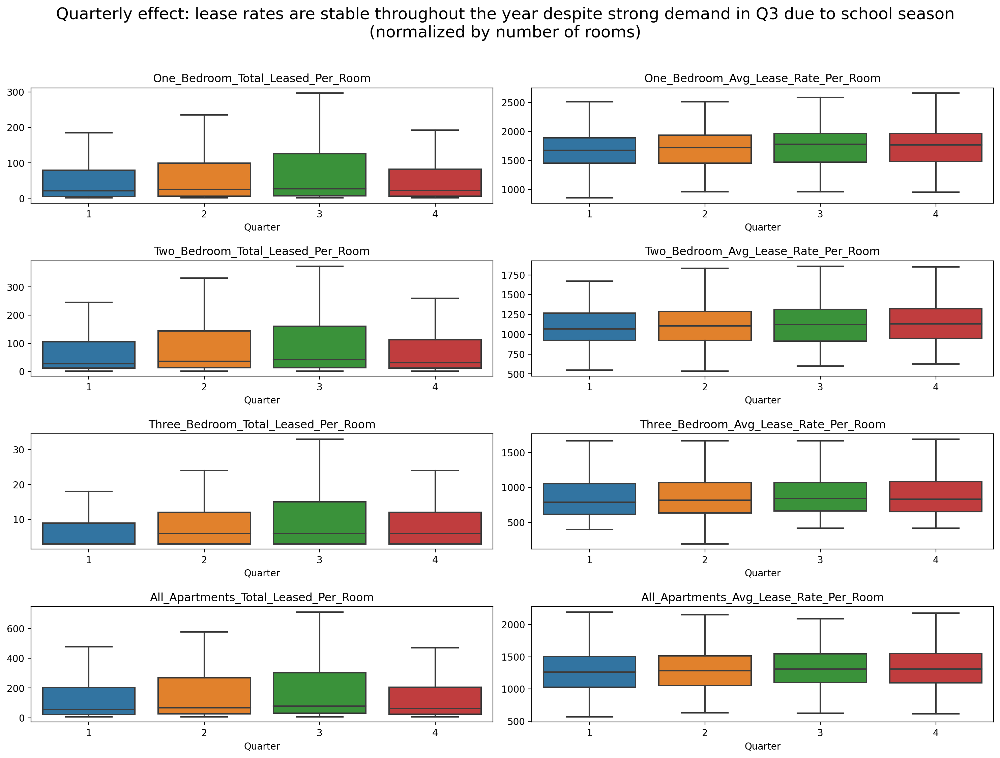

In [155]:
vars = ['One_Bedroom_Total_Leased_Per_Room',
       'One_Bedroom_Avg_Lease_Rate_Per_Room',
       'Two_Bedroom_Total_Leased_Per_Room',
       'Two_Bedroom_Avg_Lease_Rate_Per_Room',
       'Three_Bedroom_Total_Leased_Per_Room',
       'Three_Bedroom_Avg_Lease_Rate_Per_Room',
       'All_Apartments_Total_Leased_Per_Room',
       'All_Apartments_Avg_Lease_Rate_Per_Room']

fig, axes = plt.subplots(int(len(vars)/2),2)
fig.tight_layout()
plt.subplots_adjust(hspace=0.5)
for var, ax in zip(vars, axes.flatten()):
    sns.boxplot(x='Quarter', y=var,data=neighborhoods_rental, 
                showfliers = False, # remove outliers
                ax=ax)
    ax.set_ylabel('')
    ax.set_title(var) 
    
fig.suptitle('Quarterly effect: lease rates are stable throughout the year despite strong demand in Q3 due to school season\n(normalized by number of rooms)', 
             size='xx-large', y = 1.1)

Top 5 most expensive MLS districts: 
 district
C02    2367.0
C09    1922.5
C01    1594.5
W01    1548.0
C08    1478.0
Name: Two_Bedroom_Avg_Lease_Rate_Per_Room, dtype: float64


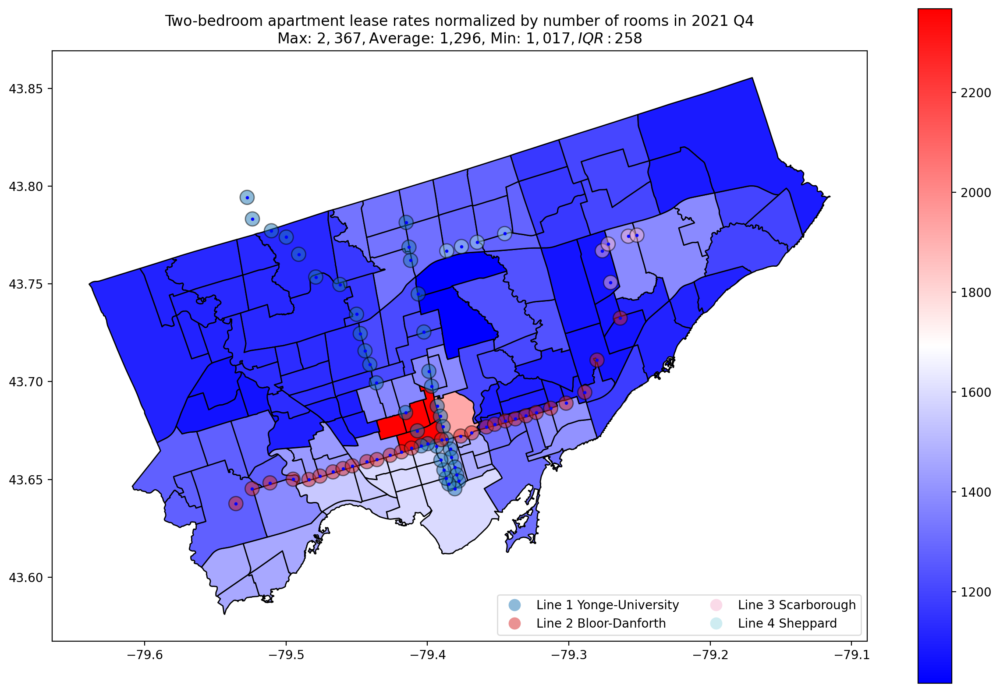

In [126]:
selected_year = 2021
selected_quarter = 4
var = 'Two_Bedroom_Avg_Lease_Rate_Per_Room'
selected_period = neighborhoods_rental.loc[(neighborhoods_rental['Year'] == selected_year) & (neighborhoods_rental['Quarter'] == selected_quarter)]


ax = selected_period.plot(column = var,
                     legend = True,
                     edgecolor = 'black',
                     cmap = "bwr",
                     )

# annotate MLS districts
# for geometry, label in zip(selected_period.geometry, selected_period.district):
#     ax.annotate(label, xy=(geometry.centroid.x, geometry.centroid.y), ha='center')
    
stations_area.plot(column = 'line', 
                edgecolor = 'black', 
                alpha = 0.5,
                cmap = 'tab20',
                legend = True,
                legend_kwds = {'loc': 'lower right', 
                                'ncol': 2,
                                'edgecolor': 'lightgrey'},
                ax = ax)
stations_point.plot(ax=ax, 
                    color = 'blue', 
                    markersize = 3)

    
ax.set_title(f"Two-bedroom apartment lease rates normalized by number of rooms in {selected_year} Q{selected_quarter}\nMax: ${selected_period[var].max():,.0f}, $Average: {selected_period[var].mean():,.0f}, Min: ${selected_period[var].min():,.0f}, IQR: ${selected_period[var].quantile(0.75) - selected_period[var].quantile(0.25):,.0f}")

print("Top 5 most expensive MLS districts: \n",neighborhoods_rental.loc[(neighborhoods_rental['Year'] == selected_year) & (neighborhoods_rental['Quarter'] == selected_quarter)].groupby('district')[var].mean().sort_values(ascending=False).head())

<AxesSubplot:>

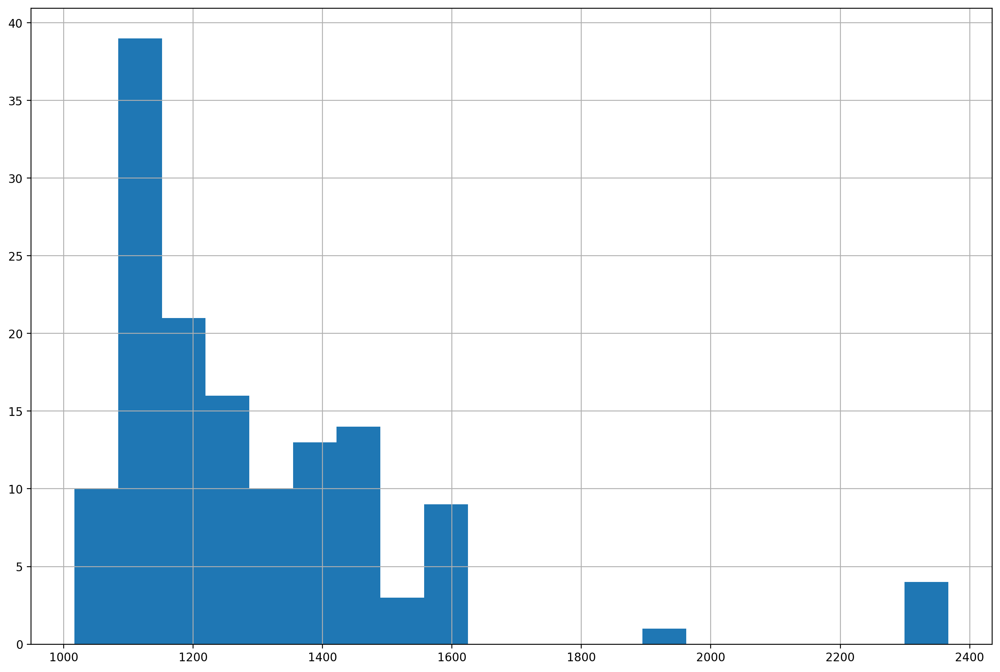

In [130]:
selected_period[var].hist(bins = 20)

# Import major crime indicators

In [9]:
# geojson format is too big -> use csv instead
mci_select = pd.read_csv('./clean_data/mci_select.csv')
mci_select['geometry'] = mci_select.apply(lambda x: shapely.geometry.Point(x['Long'], x['Lat']), axis=1)
mci_select = gpd.GeoDataFrame(mci_select, crs='epsg:' + str(epsg_3d), geometry='geometry')

C:\Users\willi\AppData\Local\Temp\ipykernel_29088\3369891977.py:2: DtypeWarning:

Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.

C:\Users\willi\miniconda3\envs\police\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning:

The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.



In [10]:
mci_select

,X,Y,Index_,event_unique_id,Division,occurrencedate,occurrenceyear,occurrencemonth,occurrenceday,occurrencedayofyear,occurrencedayofweek,MCI,Hood_ID,Neighbourhood,Long,Lat,ObjectId,geometry
0,-8.859955e+06,5.424372e+06,110,GO-20141625305,D23,2014-03-02 05:00:00+00:00,2014,March,2,61,Sunday,Assault,1,West Humber-Clairville,-79.590332,43.734013,1,POINT (-79.59033 43.73401)
1,-8.859522e+06,5.418688e+06,438,GO-20141297201,D23,2014-01-03 05:00:00+00:00,2014,January,3,3,Friday,Break and Enter,1,West Humber-Clairville,-79.586443,43.697108,5,POINT (-79.58644 43.69711)
2,-8.859354e+06,5.415799e+06,542,GO-20141302953,D23,2014-01-08 05:00:00+00:00,2014,January,8,8,Wednesday,Theft Over,1,West Humber-Clairville,-79.584931,43.678342,6,POINT (-79.58493 43.67834)
3,-8.863263e+06,5.422674e+06,546,GO-20141304312,D23,2014-01-08 05:00:00+00:00,2014,January,8,8,Wednesday,Break and Enter,1,West Humber-Clairville,-79.620043,43.722990,7,POINT (-79.62004 43.72299)
4,-8.859354e+06,5.415799e+06,593,GO-20141303907,D23,2014-01-06 05:00:00+00:00,2014,January,6,6,Monday,Theft Over,1,West Humber-Clairville,-79.584931,43.678342,8,POINT (-79.58493 43.67834)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
280664,-8.859224e+06,5.426345e+06,1366,GO-2020898005,D23,2020-05-14 04:00:00+00:00,2020,May,14,135,Thursday,Homicide,2,Mount Olive-Silverstone-Jamestown,-79.583768,43.746816,1248,POINT (-79.58377 43.74682)
280665,-8.830322e+06,5.431112e+06,1367,GO-2020915335,D42,2020-05-17 04:00:00+00:00,2020,May,17,138,Sunday,Homicide,46,Pleasant View,-79.324129,43.777743,1249,POINT (-79.32413 43.77774)
280666,-8.822707e+06,5.425298e+06,1368,GO-2020909524,D41,2020-05-19 04:00:00+00:00,2020,May,19,140,Tuesday,Homicide,138,Eglinton East,-79.255724,43.740025,1250,POINT (-79.25572 43.74002)
280667,-8.837879e+06,5.410726e+06,1369,GO-2020971451,D52,2020-05-26 04:00:00+00:00,2020,May,26,147,Tuesday,Homicide,77,Waterfront Communities-The Island,-79.392021,43.645372,1251,POINT (-79.39202 43.64537)


In [11]:
mci_select.MCI.unique()

array(['Assault', 'Break and Enter', 'Theft Over', 'Robbery',
       'Auto Theft', 'Shootings', 'Homicide'], dtype=object)

In [12]:
mci_select.columns

Index(['X', 'Y', 'Index_', 'event_unique_id', 'Division', 'occurrencedate',
       'occurrenceyear', 'occurrencemonth', 'occurrenceday',
       'occurrencedayofyear', 'occurrencedayofweek', 'MCI', 'Hood_ID',
       'Neighbourhood', 'Long', 'Lat', 'ObjectId', 'geometry'],
      dtype='object')

In [17]:
mci_select.replace({'occurrencemonth': {'January': 'Jan', 
                                        'February': 'Feb', 
                                        'March': 'Mar', 
                                        'April': 'Apr', 
                                        'May': 'May', 
                                        'June': 'Jun', 
                                        'July': 'Jul', 
                                        'August': 'Aug', 
                                        'September': 'Sep', 
                                        'October': 'Oct', 
                                        'November': 'Nov', 
                                        'December': 'Dec'},
                    'occurrencedayofweek': {'Monday': "Mon", 
                                            'Tuesday': "Tue", 
                                            'Wednesday': "Wed", 
                                            'Thursday': "Thu", 
                                            'Friday': "Fri", 
                                            'Saturday': "Sat", 
                                            'Sunday': "Sun"}}, inplace=True)

Text(0.5, 0.98, 'Number of crimes by time period in City of Toronto')

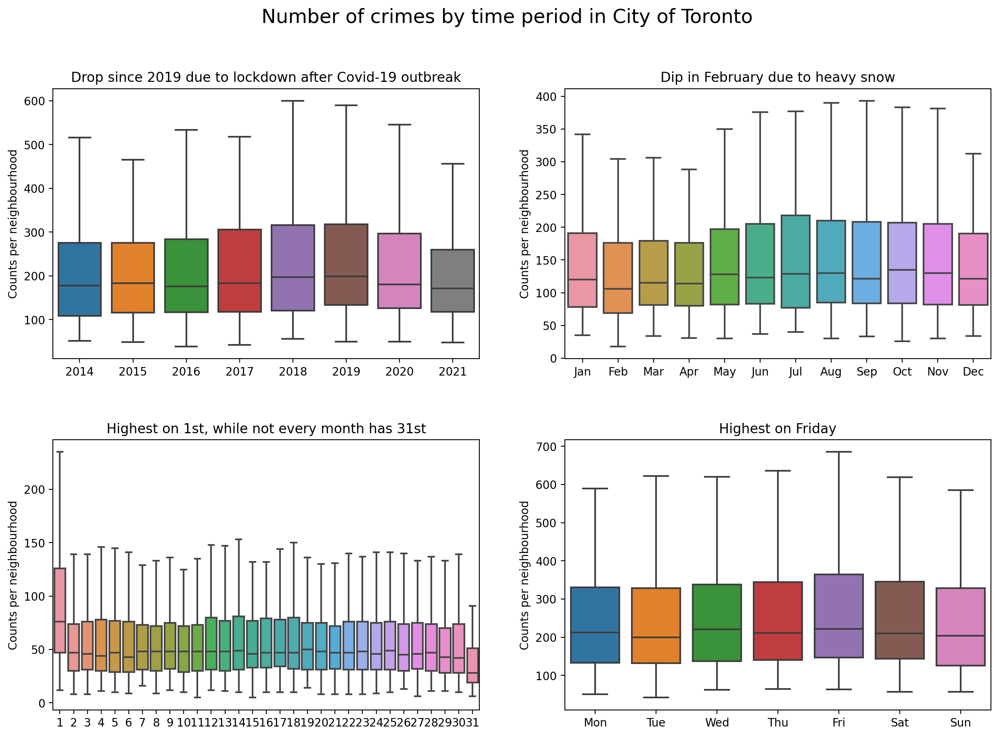

In [37]:
vars = ['occurrenceyear', 
        'occurrencemonth', 
        'occurrenceday',
        'occurrencedayofweek']
vars_cat = [[2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021],
            ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
            np.arange(1,32,1),
            ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
            ]
titles = ['Drop since 2019 due to lockdown after Covid-19 outbreak',
         'Dip in February due to heavy snow',
         'Highest on 1st, while not every month has 31st',
         'Highest on Friday']

fig, axes = plt.subplots(int(len(vars)/2),2)
plt.subplots_adjust(hspace=0.3)
for var, var_cat, title, ax in zip(vars, vars_cat, titles, axes.flatten()):    
    mci_select[var] = mci_select[var].astype('category').cat.set_categories(var_cat)
    sns.boxplot(data = mci_select.groupby(['Neighbourhood', var]).size().reset_index(name='count'), 
                x = var,
                y = 'count',
                showfliers = False,
                ax = ax)
    ax.set_ylabel('Counts per neighbourhood')
    ax.set_xlabel('')
    ax.set_title(title)

fig.suptitle('Number of crimes by time period in City of Toronto', size='xx-large')

Text(0.5, 0.98, 'Number of crimes by type in Toronto neighbourhoods')

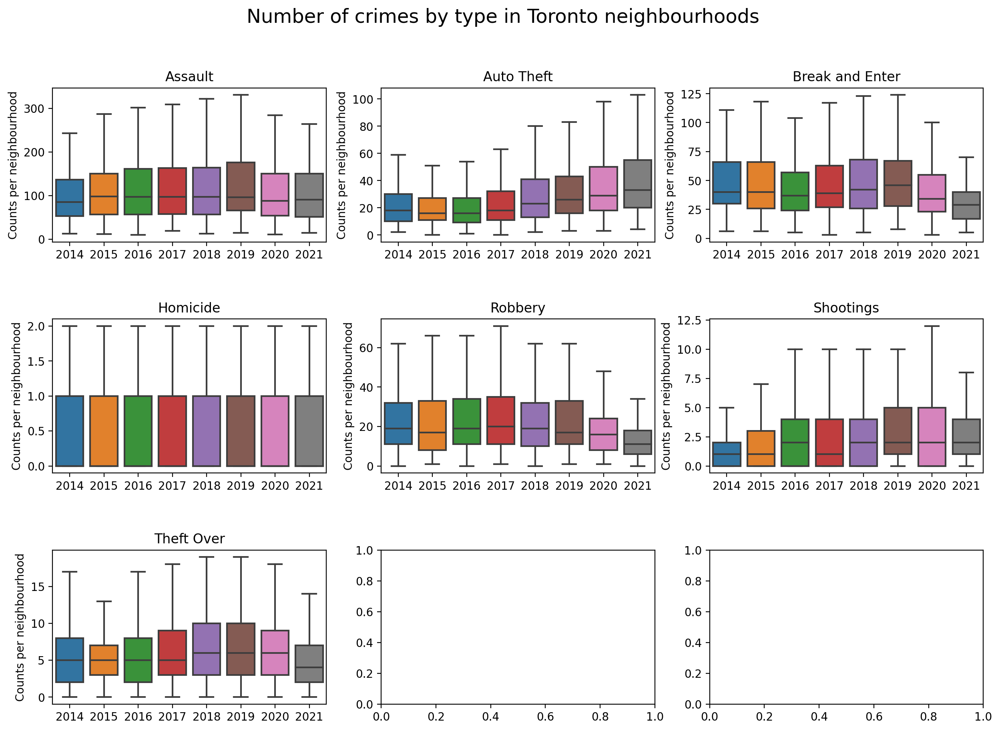

In [141]:
vars = sorted(mci_select.MCI.unique())
fig, axes = plt.subplots(int(math.ceil(len(vars)/3)),3)
plt.subplots_adjust(hspace=0.5)
for var, ax in zip(vars, axes.flatten()):    
    sns.boxplot(data = mci_select[mci_select.MCI == var].groupby(['Neighbourhood', 'occurrenceyear']).size().reset_index(name='count'), 
                x = 'occurrenceyear',
                y = 'count',
                showfliers = False,
                ax = ax)
    ax.set_ylabel('Counts per neighbourhood')
    ax.set_xlabel('')
    ax.set_title(f"{var}")

fig.suptitle('Number of crimes by type in Toronto neighbourhoods', size='xx-large')

## Neighbourhood crime rate and density

In [90]:
neighbourhoods_crime = gpd.read_file('./clean_data/neighbourhoods_crime.geojson')
neighbourhoods_crime

,Neighbourhood,Hood_ID,district,distance_km,Assault_Count2014,Assault_Count2015,Assault_Count2016,Assault_Count2017,Assault_Count2018,Assault_Count2019,Assault_Count2020,Assault_Count2021,Assault_Density2014,Assault_Density2015,Assault_Density2016,Assault_Density2017,Assault_Density2018,Assault_Density2019,Assault_Density2020,Assault_Density2021,Assault_Rate2014,Assault_Rate2015,Assault_Rate2016,Assault_Rate2017,Assault_Rate2018,Assault_Rate2019,Assault_Rate2020,Assault_Rate2021,AutoTheft_Count2014,AutoTheft_Count2015,AutoTheft_Count2016,AutoTheft_Count2017,AutoTheft_Count2018,AutoTheft_Count2019,AutoTheft_Count2020,AutoTheft_Count2021,AutoTheft_Density2014,AutoTheft_Density2015,AutoTheft_Density2016,AutoTheft_Density2017,AutoTheft_Density2018,AutoTheft_Density2019,AutoTheft_Density2020,AutoTheft_Density2021,AutoTheft_Rate2014,AutoTheft_Rate2015,AutoTheft_Rate2016,AutoTheft_Rate2017,AutoTheft_Rate2018,AutoTheft_Rate2019,AutoTheft_Rate2020,AutoTheft_Rate2021,BreakandEnter_Count2014,BreakandEnter_Count2015,BreakandEnter_Count2016,BreakandEnter_Count2017,BreakandEnter_Count2018,BreakandEnter_Count2019,BreakandEnter_Count2020,BreakandEnter_Count2021,BreakandEnter_Density2014,BreakandEnter_Density2015,BreakandEnter_Density2016,BreakandEnter_Density2017,BreakandEnter_Density2018,BreakandEnter_Density2019,BreakandEnter_Density2020,BreakandEnter_Density2021,BreakandEnter_Rate2014,BreakandEnter_Rate2015,BreakandEnter_Rate2016,BreakandEnter_Rate2017,BreakandEnter_Rate2018,BreakandEnter_Rate2019,BreakandEnter_Rate2020,BreakandEnter_Rate2021,Homicide_Count2014,Homicide_Count2015,Homicide_Count2016,Homicide_Count2017,Homicide_Count2018,Homicide_Count2019,Homicide_Count2020,Homicide_Count2021,Homicide_Density2014,Homicide_Density2015,Homicide_Density2016,Homicide_Density2017,Homicide_Density2018,Homicide_Density2019,Homicide_Density2020,Homicide_Density2021,Homicide_Rate2014,Homicide_Rate2015,Homicide_Rate2016,Homicide_Rate2017,Homicide_Rate2018,Homicide_Rate2019,Homicide_Rate2020,Homicide_Rate2021,MCI_Count2014,MCI_Count2015,MCI_Count2016,MCI_Count2017,MCI_Count2018,MCI_Count2019,MCI_Count2020,MCI_Count2021,MCI_Density2014,MCI_Density2015,MCI_Density2016,MCI_Density2017,MCI_Density2018,MCI_Density2019,MCI_Density2020,MCI_Density2021,MCI_Rate2014,MCI_Rate2015,MCI_Rate2016,MCI_Rate2017,MCI_Rate2018,MCI_Rate2019,MCI_Rate2020,MCI_Rate2021,Robbery_Count2014,Robbery_Count2015,Robbery_Count2016,Robbery_Count2017,Robbery_Count2018,Robbery_Count2019,Robbery_Count2020,Robbery_Count2021,Robbery_Density2014,Robbery_Density2015,Robbery_Density2016,Robbery_Density2017,Robbery_Density2018,Robbery_Density2019,Robbery_Density2020,Robbery_Density2021,Robbery_Rate2014,Robbery_Rate2015,Robbery_Rate2016,Robbery_Rate2017,Robbery_Rate2018,Robbery_Rate2019,Robbery_Rate2020,Robbery_Rate2021,Shootings_Count2014,Shootings_Count2015,Shootings_Count2016,Shootings_Count2017,Shootings_Count2018,Shootings_Count2019,Shootings_Count2020,Shootings_Count2021,Shootings_Density2014,Shootings_Density2015,Shootings_Density2016,Shootings_Density2017,Shootings_Density2018,Shootings_Density2019,Shootings_Density2020,Shootings_Density2021,Shootings_Rate2014,Shootings_Rate2015,Shootings_Rate2016,Shootings_Rate2017,Shootings_Rate2018,Shootings_Rate2019,Shootings_Rate2020,Shootings_Rate2021,TheftOver_Count2014,TheftOver_Count2015,TheftOver_Count2016,TheftOver_Count2017,TheftOver_Count2018,TheftOver_Count2019,TheftOver_Count2020,TheftOver_Count2021,TheftOver_Density2014,TheftOver_Density2015,TheftOver_Density2016,TheftOver_Density2017,TheftOver_Density2018,TheftOver_Density2019,TheftOver_Density2020,TheftOver_Density2021,TheftOver_Rate2014,TheftOver_Rate2015,TheftOver_Rate2016,TheftOver_Rate2017,TheftOver_Rate2018,TheftOver_Rate2019,TheftOver_Rate2020,TheftOver_Rate2021,geometry
0,Yonge-St.Clair,97,C02,2.791462,18.0,24.0,35.0,25.0,33.0,33.0,25.0,48.0,15.499636,20.666181,30.138181,21.527272,28.416000,28.416000,21.527272,41.332363,142.891165,188.294367,270.270270,189.193280,244.299674,239

In [93]:
crime_type = sorted(list(set([re.search('(\w+)_Rate', x).group(1) for x in neighbourhoods_crime.columns if re.search('(\w+)_Rate', x) is not None])))
crime_type

['Assault',
 'AutoTheft',
 'BreakandEnter',
 'Homicide',
 'MCI',
 'Robbery',
 'Shootings',
 'TheftOver']

In [95]:
# set custom order for display
custom_crime_order = ['MCI','Assault', 'AutoTheft','BreakandEnter','Robbery','TheftOver','Homicide','Shootings']
crime_rate = [x + '_Rate' for x in custom_crime_order]
crime_density = [x + '_Density' for x in custom_crime_order]
crime_years = sorted(list(set([re.search('\d+', x).group(0) for x in neighbourhoods_crime.columns if re.search('\d+', x) is not None])))

In [96]:
def plot_crime(var, title):
    fig, axes = plt.subplots(len(crime_years), len(var))

    for j in range(axes.shape[1]):
        # fix the range for each type of crime so we can compare across years
        vmin, vmax = neighbourhoods_crime[[var[j] + str(year) for year in crime_years]].min().min(), neighbourhoods_crime[[var[j] + str(year) for year in crime_years]].max().max()
        norm = TwoSlopeNorm(vmin=vmin, vcenter= np.mean([vmin, vmax]), vmax=vmax)
        for i in range(axes.shape[0]):  
            neighbourhoods_crime.plot(column = var[j] + str(crime_years[i]), 
                                cmap = 'viridis',
                                norm = norm,
                                ax = axes[i, j])
        
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].set_yticks([])
            if i == 0:
                axes[i,j].set_title(var[j].split("_")[0])
            if j == 0:
                axes[i,j].set_ylabel(crime_years[i], rotation=90, size='large')

    fig.suptitle(title, size='xx-large')

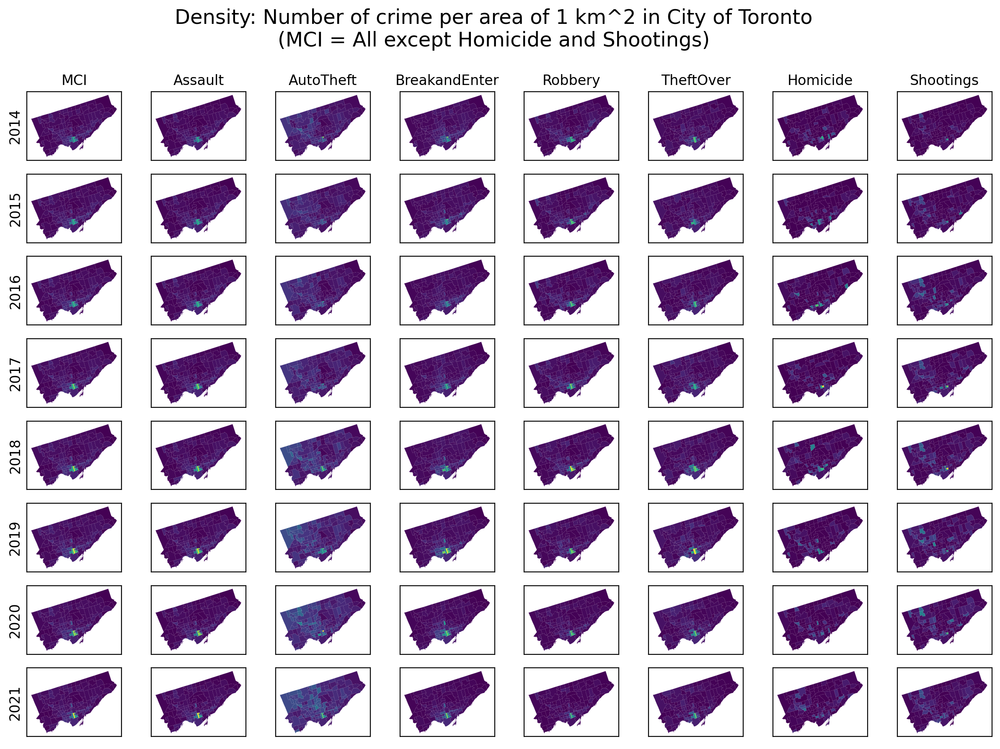

In [98]:
plot_crime(crime_density, 'Density: Number of crime per area of 1 km^2 in City of Toronto\n(MCI = All except Homicide and Shootings)')

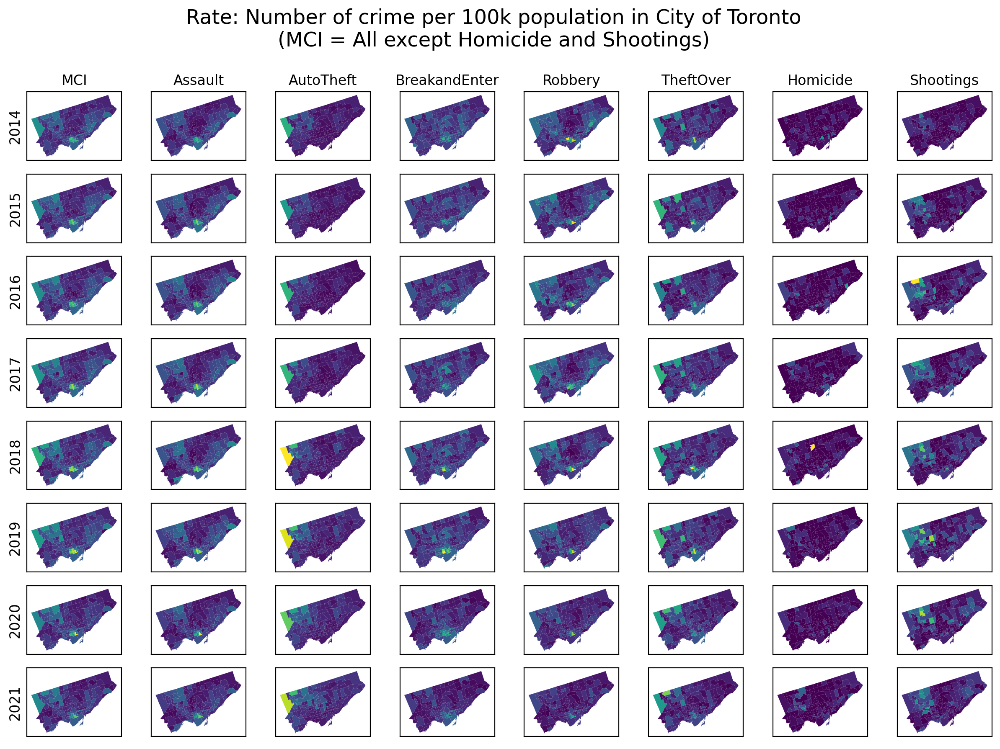

In [99]:
plot_crime(crime_rate, 'Rate: Number of crime per 100k population in City of Toronto\n(MCI = All except Homicide and Shootings)')

In [55]:
# plotly version
# crime_allrate = pd.wide_to_long(neighbourhoods_crime[['Neighbourhood', 'Hood_ID', 'geometry'] + ['All_Rate' + str(year) for year in crime_years]],]], 
#                                   stubnames= "All_Rate", 
#                                   i=['Neighbourhood', 'Hood_ID'], 
#                                   j='year',
#                                   sep='').reset_index()

# crime_allrate.head()

# fig = px.choropleth(crime_allrate, 
#               geojson=crime_allrate.geometry,
#               locations=crime_allrate.index,
#               color = 'All_Rate',
#               animation_frame='year',
#               color_continuous_scale="Viridis",
#               hover_data=['Neighbourhood'])
# fig.update_geos(fitbounds="locations", visible=False)

Text(0.5, 257.52801096780723, 'Longitude')

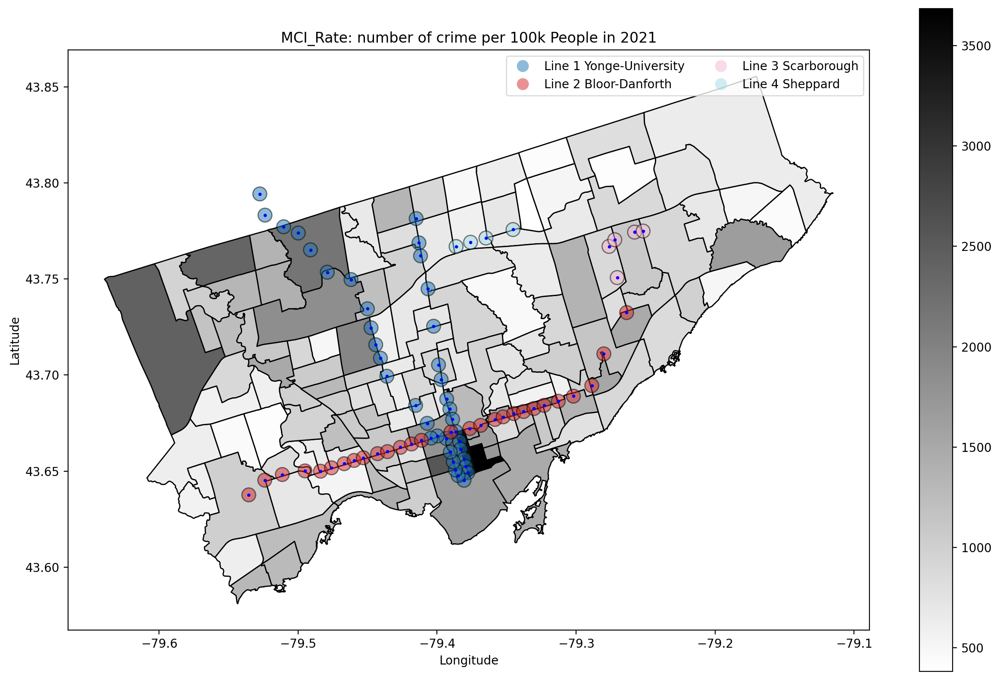

In [101]:
var = "MCI_Rate"
year = 2021
ax = neighbourhoods_crime.plot(column = var + str(year), 
                               edgecolor = 'black',
                               cmap = 'binary',
                               # norm = norm,
                               legend = True)

stations_area.plot(column = 'line', 
                edgecolor = 'black', 
                alpha = 0.5,
                cmap = 'tab20',
                legend = True,
                legend_kwds = {'loc': 'upper right', 
                                'ncol': 2,
                                'edgecolor': 'lightgrey'},
                ax = ax)
stations_point.plot(ax=ax, 
                    color = 'blue', 
                    markersize = 3)

ax.set_title(var + ": number of crime per 100k People in " + str(year))
ax.set_ylabel("Latitude")
ax.set_xlabel("Longitude")

# Import traffic collisions

In [144]:
# geojson format is too big -> use csv instead
collision_point = pd.read_csv('./clean_data/collision_point.csv')
collision_point['geometry'] = collision_point.apply(lambda x: shapely.geometry.Point(x['Long'], x['Lat']), axis=1)
collision_point = gpd.GeoDataFrame(collision_point, crs='epsg:' + str(epsg_3d), geometry='geometry')

C:\Users\willi\miniconda3\envs\police\lib\site-packages\pandas\core\dtypes\cast.py:122: ShapelyDeprecationWarning:

The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.



In [145]:
collision_point

,X,Y,ObjectId,event_unique_id,occurrencedate,occurrencemonth,occurrencedayofweek,occurrenceyear,occurrencehour,Division,Neighbourhood,Fatalities,Injury_Collisions,FTR_Collisions,PD_Collisions,Long,Lat,ObjectId2,Hood_ID,occurrenceday,occurrencedayofyear,geometry,Fatal_Collisions
0,0.000000e+00,0.000000e+00,278,GO-20141591056,2014-02-24 17:00:00-04:00,February,Monday,2014,17,D32,St.Andrew-Windfields,0,0,1,0,-79.402034,43.748097,178,40,24.0,55.0,POINT (-79.40203 43.74810),0
1,0.000000e+00,0.000000e+00,1246,GO-20143120578,2014-10-17 09:00:00-04:00,October,Friday,2014,9,D31,Glenfield-Jane Heights,0,0,0,1,-79.513544,43.743014,1046,25,17.0,290.0,POINT (-79.51354 43.74301),0
2,0.000000e+00,0.000000e+00,21564,GO-20168056919,2016-12-17 09:00:00-04:00,December,Saturday,2016,9,D31,York University Heights,0,0,0,1,-79.498253,43.763907,21094,27,17.0,352.0,POINT (-79.49825 43.76391),0
3,0.000000e+00,0.000000e+00,21709,GO-20168059092,2016-12-27 18:00:00-04:00,December,Tuesday,2016,18,D32,Yorkdale-Glen Park,0,0,1,0,-79.459962,43.707040,21162,31,27.0,362.0,POINT (-79.45996 43.70704),0
4,0.000000e+00,0.000000e+00,21277,GO-20168053844,2016-11-30 18:00:00-04:00,November,Wednesday,2016,18,D33,Hillcrest Village,0,0,0,1,-79.352088,43.807805,21340,48,30.0,335.0,POINT (-79.35209 43.80780),0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
430281,-8.865398e+06,5.426816e+06,499212,GO-20178006796,2017-02-14 14:00:00-04:00,February,Tuesday,2017,14,NSA,NSA,0,0,0,1,-79.639225,43.749873,499534,NSA,14.0,45.0,POINT (-79.63923 43.74987),0
430282,-8.865398e+06,5.426816e+06,499213,GO-20178007507,2017-02-18 13:00:00-04:00,February,Saturday,2017,13,NSA,NSA,0,0,1,0,-79.639225,43.749873,499535,NSA,18.0,49.0,POINT (-79.63923 43.74987),0
430283,-8.865398e+06,5.426816e+06,499214,GO-20178008123,2017-02-22 22:00:00-04:00,February,Wednesday,2017,22,D23,West Humber-Clairville,0,0,0,1,-79.639225,43.749873,499536,1,22.0,53.0,POINT (-79.63923 43.74987),0
430284,-8.865398e+06,5.426816e+06,499215,GO-20178014940,2017-04-07 14:00:00-04:00,April,Friday,2017,14,NSA,NSA,0,0,0,1,-79.639225,43.749873,499537,NSA,7.0,97.0,POINT (-79.63923 43.74987),0


In [146]:
collision_point.columns

Index(['X', 'Y', 'ObjectId', 'event_unique_id', 'occurrencedate',
       'occurrencemonth', 'occurrencedayofweek', 'occurrenceyear',
       'occurrencehour', 'Division', 'Neighbourhood', 'Fatalities',
       'Injury_Collisions', 'FTR_Collisions', 'PD_Collisions', 'Long', 'Lat',
       'ObjectId2', 'Hood_ID', 'occurrenceday', 'occurrencedayofyear',
       'geometry', 'Fatal_Collisions'],
      dtype='object')

In [147]:
collision_point.replace({'occurrencemonth': {'January': 'Jan', 
                                             'February': 'Feb', 
                                             'March': 'Mar', 
                                             'April': 'Apr', 
                                             'May': 'May', 
                                             'June': 'Jun', 
                                             'July': 'Jul', 
                                             'August': 'Aug', 
                                             'September': 'Sep', 
                                             'October': 'Oct', 
                                             'November': 'Nov', 
                                             'December': 'Dec'},
                         'occurrencedayofweek': {'Monday': "Mon", 
                                                 'Tuesday': "Tue", 
                                                 'Wednesday': "Wed", 
                                                 'Thursday': "Thu", 
                                                 'Friday': "Fri", 
                                                 'Saturday': "Sat", 
                                                 'Sunday': "Sun"}}, inplace=True)

Text(0.5, 0.98, 'Number of traffic collisions by time period in Toronto neighbourhoods')

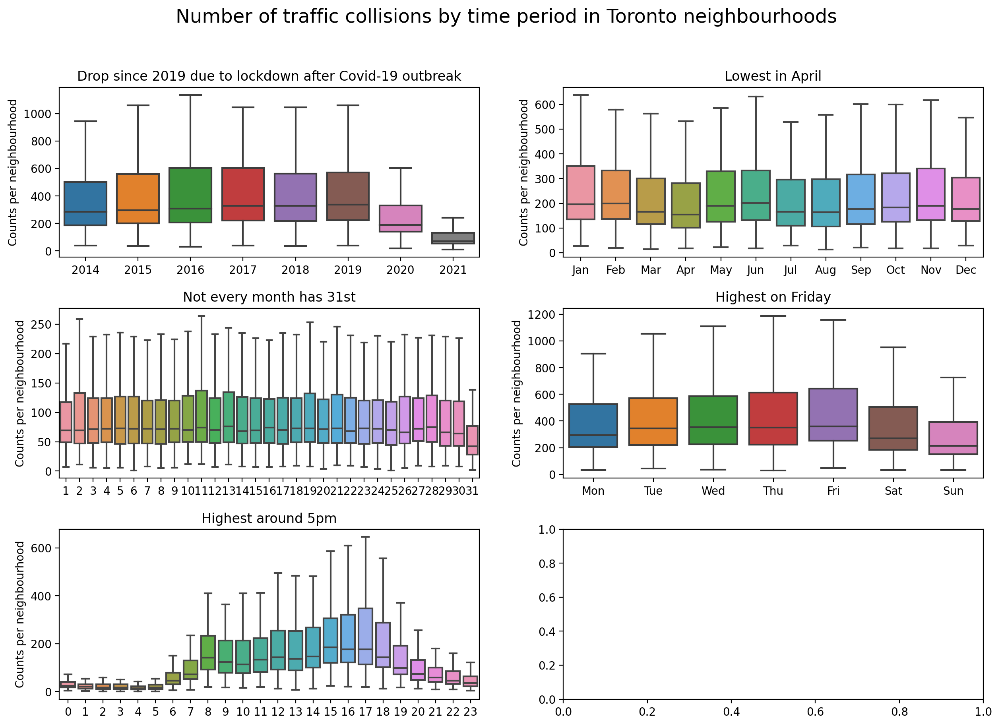

In [156]:
vars = ['occurrenceyear', 
        'occurrencemonth', 
        'occurrenceday',
        'occurrencedayofweek',
        'occurrencehour']
vars_cat = [[2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021],
            ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
            np.arange(1,32,1),
            ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'],
            np.arange(0,24,1)
            ]
titles = ['Drop since 2019 due to lockdown after Covid-19 outbreak',
         'Lowest in April',
         'Not every month has 31st',
         'Highest on Friday',
         'Highest around 5pm']

fig, axes = plt.subplots(int(math.ceil(len(vars)/2)),2)
plt.subplots_adjust(hspace=0.3)
for var, var_cat, title, ax in zip(vars, vars_cat, titles, axes.flatten()):    
    collision_point[var] = collision_point[var].astype('category').cat.set_categories(var_cat)
    sns.boxplot(data = collision_point.groupby(['Neighbourhood', var]).size().reset_index(name='count'), 
                x = var,
                y = 'count',
                showfliers = False,
                ax = ax)
    ax.set_ylabel('Counts per neighbourhood')
    ax.set_xlabel('')
    ax.set_title(title)

fig.suptitle('Number of traffic collisions by time period in Toronto neighbourhoods', size='xx-large')

Text(0.5, 0.98, 'Traffic collisions in Toronto neighbourhoods')

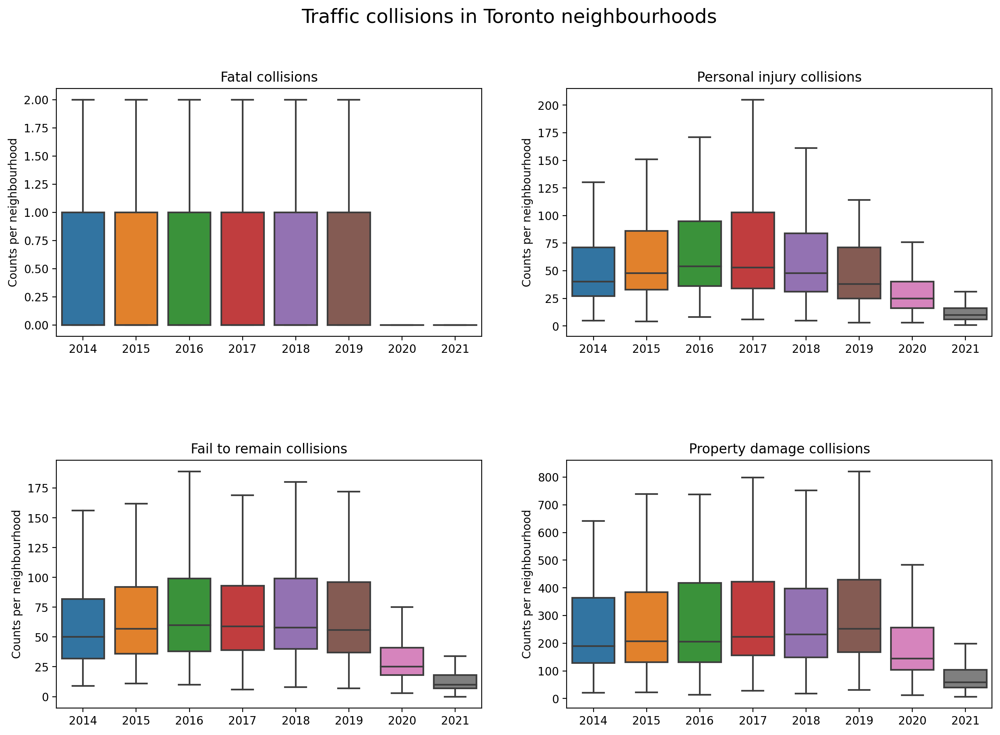

In [198]:
vars = ['Fatal_Collisions', 'Injury_Collisions', 'FTR_Collisions', 'PD_Collisions']
titles = ['Fatal collisions',
          'Personal injury collisions', 
          'Fail to remain collisions', 
          'Property damage collisions']
fig, axes = plt.subplots(int(math.ceil(len(vars)/2)),2)
plt.subplots_adjust(hspace=0.5)
for var, title, ax in zip(vars, titles, axes.flatten()):    
    sns.boxplot(data = collision_point.groupby(['Neighbourhood', 'occurrenceyear']).agg({var: 'sum'}).reset_index(), 
                x = 'occurrenceyear',
                y = var,
                showfliers = False,
                ax = ax)
    ax.set_ylabel('Counts per neighbourhood')
    ax.set_xlabel('')
    ax.set_title(f"{title}")

fig.suptitle('Traffic collisions in Toronto neighbourhoods', size='xx-large')

## Neighbourhood collision rate and density

In [199]:
neighbourhoods_collision = gpd.read_file('./clean_data/neighbourhoods_collision.geojson')
neighbourhoods_collision

,Neighbourhood,Hood_ID,district,distance_km,Collision_Count2014,Collision_Count2015,Collision_Count2016,Collision_Count2017,Collision_Count2018,Collision_Count2019,Collision_Count2020,Collision_Count2021,Collision_Density2014,Collision_Density2015,Collision_Density2016,Collision_Density2017,Collision_Density2018,Collision_Density2019,Collision_Density2020,Collision_Density2021,Collision_Rate2014,Collision_Rate2015,Collision_Rate2016,Collision_Rate2017,Collision_Rate2018,Collision_Rate2019,Collision_Rate2020,Collision_Rate2021,FatalCollisions_Count2014,FatalCollisions_Count2015,FatalCollisions_Count2016,FatalCollisions_Count2017,FatalCollisions_Count2018,FatalCollisions_Count2019,FatalCollisions_Count2020,FatalCollisions_Count2021,FatalCollisions_Density2014,FatalCollisions_Density2015,FatalCollisions_Density2016,FatalCollisions_Density2017,FatalCollisions_Density2018,FatalCollisions_Density2019,FatalCollisions_Density2020,FatalCollisions_Density2021,FatalCollisions_Rate2014,FatalCollisions_Rate2015,FatalCollisions_Rate2016,FatalCollisions_Rate2017,FatalCollisions_Rate2018,FatalCollisions_Rate2019,FatalCollisions_Rate2020,FatalCollisions_Rate2021,FtrCollisions_Count2014,FtrCollisions_Count2015,FtrCollisions_Count2016,FtrCollisions_Count2017,FtrCollisions_Count2018,FtrCollisions_Count2019,FtrCollisions_Count2020,FtrCollisions_Count2021,FtrCollisions_Density2014,FtrCollisions_Density2015,FtrCollisions_Density2016,FtrCollisions_Density2017,FtrCollisions_Density2018,FtrCollisions_Density2019,FtrCollisions_Density2020,FtrCollisions_Density2021,FtrCollisions_Rate2014,FtrCollisions_Rate2015,FtrCollisions_Rate2016,FtrCollisions_Rate2017,FtrCollisions_Rate2018,FtrCollisions_Rate2019,FtrCollisions_Rate2020,FtrCollisions_Rate2021,InjuryCollisions_Count2014,InjuryCollisions_Count2015,InjuryCollisions_Count2016,InjuryCollisions_Count2017,InjuryCollisions_Count2018,InjuryCollisions_Count2019,InjuryCollisions_Count2020,InjuryCollisions_Count2021,InjuryCollisions_Density2014,InjuryCollisions_Density2015,InjuryCollisions_Density2016,InjuryCollisions_Density2017,InjuryCollisions_Density2018,InjuryCollisions_Density2019,InjuryCollisions_Density2020,InjuryCollisions_Density2021,InjuryCollisions_Rate2014,InjuryCollisions_Rate2015,InjuryCollisions_Rate2016,InjuryCollisions_Rate2017,InjuryCollisions_Rate2018,InjuryCollisions_Rate2019,InjuryCollisions_Rate2020,InjuryCollisions_Rate2021,PdCollisions_Count2014,PdCollisions_Count2015,PdCollisions_Count2016,PdCollisions_Count2017,PdCollisions_Count2018,PdCollisions_Count2019,PdCollisions_Count2020,PdCollisions_Count2021,PdCollisions_Density2014,PdCollisions_Density2015,PdCollisions_Density2016,PdCollisions_Density2017,PdCollisions_Density2018,PdCollisions_Density2019,PdCollisions_Density2020,PdCollisions_Density2021,PdCollisions_Rate2014,PdCollisions_Rate2015,PdCollisions_Rate2016,PdCollisions_Rate2017,PdCollisions_Rate2018,PdCollisions_Rate2019,PdCollisions_Rate2020,PdCollisions_Rate2021,geometry
0,Yonge-St.Clair,97,C02,2.791462,238.0,275.0,288.0,305.0,301.0,315.0,191.0,68.0,204.939633,236.799996,247.994178,262.632723,259.188359,271.243632,164.468361,58.554181,1889.338731,2157.539620,2223.938224,2308.158014,2228.309150,2284.429618,1356.341429,472.838689,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.861091,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.938398,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,32.0,44.0,55.0,60.0,53.0,51.0,18.0,8.0,27.554909,37.887999,47.359999,51.665454,45.637817,43.915636,15.499636,6.888727,254.028737,345.206339,424.710425,454.063872,392.360083,369.860033,127.822752,55.628081,21.0,31.0,34.0,33.0,18.0,22.0,13.0,6.0,18.082909,26.693818,29.277090,28.416000,15.499636,18.944000,11.194182,5.166545,166.706359,243.213557,262.548263,249.735129,133.254368,159.547465,92.316432,41.721061,184.0,203.0,205.0,220.0,232.0,252.0,166.0,58.0,158.440725,174.801452,176.523633,189.439997,199.773088,216.994906,142.941089,49.943272,1460.665238,1592.656520,1583.011583,1664.90086

In [201]:
collision_type = sorted(list(set([re.search('(\w+)_Rate', x).group(1) for x in neighbourhoods_collision.columns if re.search('(\w+)_Rate', x) is not None])))
collision_type

['Collision',
 'FatalCollisions',
 'FtrCollisions',
 'InjuryCollisions',
 'PdCollisions']

In [202]:
# set custom order for display
custom_collision_order = ['Collision','FatalCollisions', 'InjuryCollisions','FtrCollisions','PdCollisions']
collision_rate = [x + '_Rate' for x in custom_collision_order]
collision_density = [x + '_Density' for x in custom_collision_order]
collision_years = sorted(list(set([re.search('\d+', x).group(0) for x in neighbourhoods_collision.columns if re.search('\d+', x) is not None])))

In [203]:
def plot_collision(var, title):
    fig, axes = plt.subplots(len(collision_years), len(var))

    for j in range(axes.shape[1]):
        # fix the range for each type of collision so we can compare across years
        vmin, vmax = neighbourhoods_collision[[var[j] + str(year) for year in collision_years]].min().min(), neighbourhoods_collision[[var[j] + str(year) for year in collision_years]].max().max()
        norm = TwoSlopeNorm(vmin=vmin, vcenter= np.mean([vmin, vmax]), vmax=vmax)
        for i in range(axes.shape[0]):  
            neighbourhoods_collision.plot(column = var[j] + str(collision_years[i]), 
                                cmap = 'viridis',
                                norm = norm,
                                ax = axes[i, j])
        
            axes[i,j].xaxis.set_visible(False)
            axes[i,j].set_yticks([])
            if i == 0:
                axes[i,j].set_title(var[j].split("_")[0])
            if j == 0:
                axes[i,j].set_ylabel(collision_years[i], rotation=90, size='large')

    fig.suptitle(title, size='xx-large')

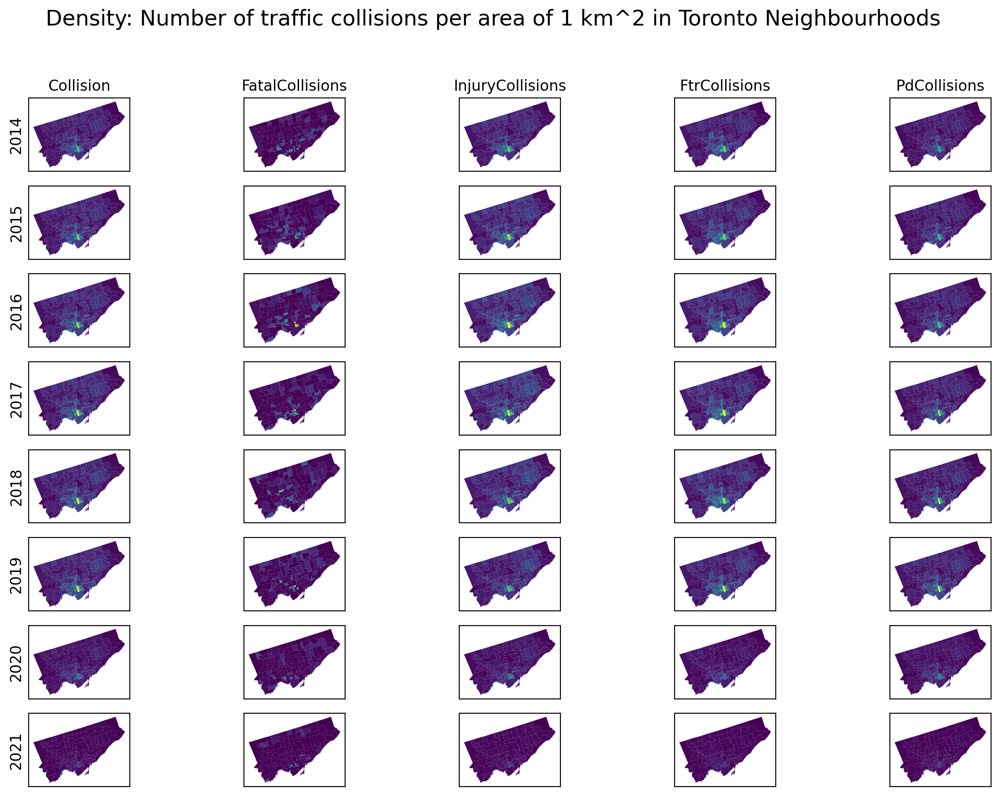

In [204]:
plot_collision(collision_density, 'Density: Number of traffic collisions per area of 1 km^2 in Toronto neighbourhoods')

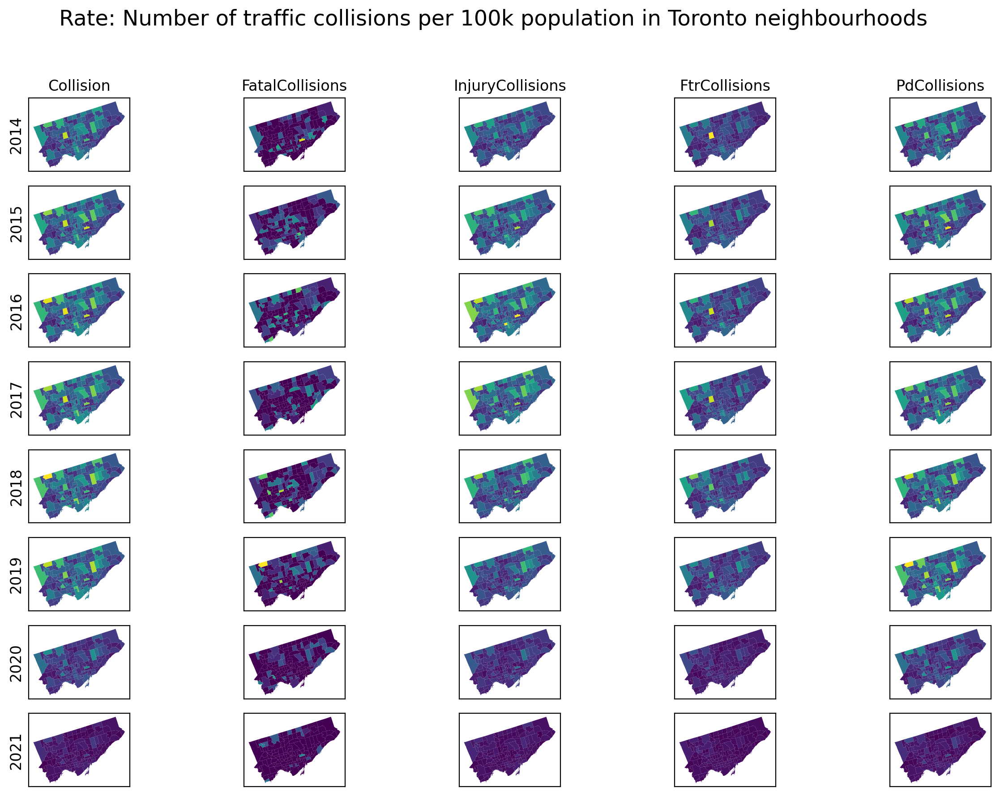

In [205]:
plot_collision(collision_rate, 'Rate: Number of traffic collisions per 100k population in Toronto neighbourhoods')

In [ ]:
# plotly version
# crime_allrate = pd.wide_to_long(neighbourhoods_crime[['Neighbourhood', 'Hood_ID', 'geometry'] + ['All_Rate' + str(year) for year in crime_years]],]], 
#                                   stubnames= "All_Rate", 
#                                   i=['Neighbourhood', 'Hood_ID'], 
#                                   j='year',
#                                   sep='').reset_index()

# crime_allrate.head()

# fig = px.choropleth(crime_allrate, 
#               geojson=crime_allrate.geometry,
#               locations=crime_allrate.index,
#               color = 'All_Rate',
#               animation_frame='year',
#               color_continuous_scale="Viridis",
#               hover_data=['Neighbourhood'])
# fig.update_geos(fitbounds="locations", visible=False)

Text(0.5, 257.52801096780723, 'Longitude')

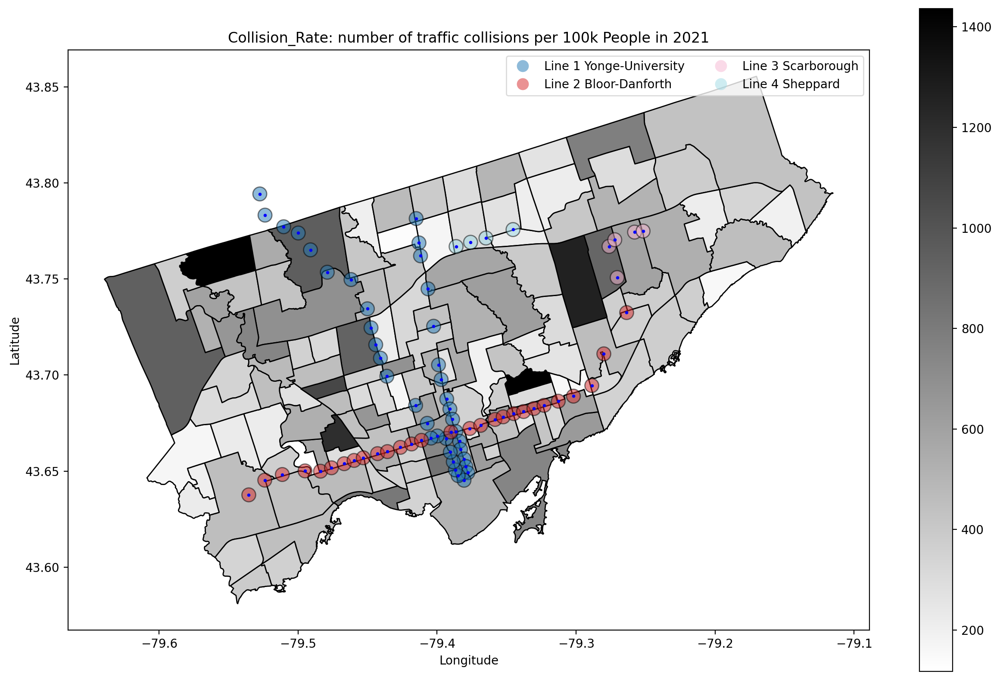

In [206]:
var = "Collision_Rate"
year = 2021
ax = neighbourhoods_collision.plot(column = var + str(year), 
                               edgecolor = 'black',
                               cmap = 'binary',
                               # norm = norm,
                               legend = True)

stations_area.plot(column = 'line', 
                edgecolor = 'black', 
                alpha = 0.5,
                cmap = 'tab20',
                legend = True,
                legend_kwds = {'loc': 'upper right', 
                                'ncol': 2,
                                'edgecolor': 'lightgrey'},
                ax = ax)
stations_point.plot(ax=ax, 
                    color = 'blue', 
                    markersize = 3)

ax.set_title(var + ": number of traffic collisions per 100k People in " + str(year))
ax.set_ylabel("Latitude")
ax.set_xlabel("Longitude")

# All-in

Text(0.5, 402.23608550009055, 'Longitude')

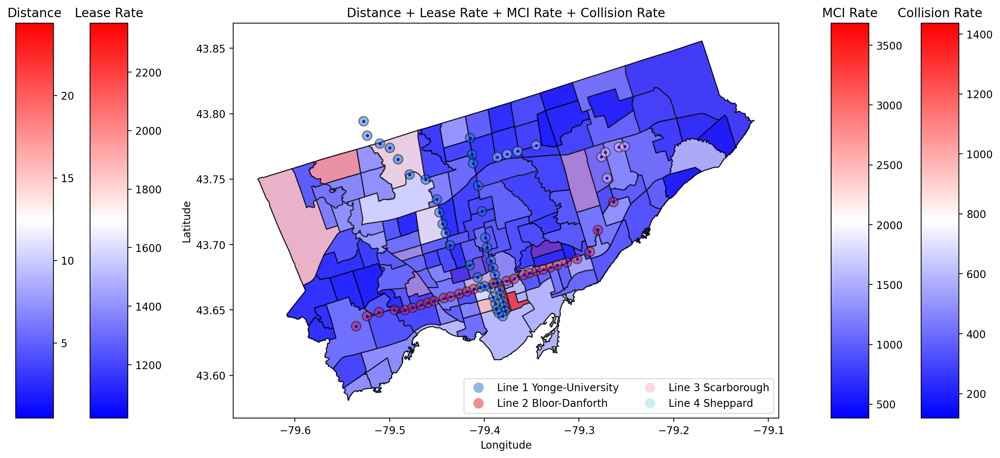

In [241]:
# safety: alpha = 1
# rental: alpha = 0.5

alphas = [0.4, 0.6, 0.8, 0.2]

fig, ax = plt.subplots(1, 1)
divider = make_axes_locatable(ax)
cax = divider.append_axes("left", size="5%", pad=1)
cax.title.set_text('Distance')
neighbourhoods.plot(column = 'distance_km', 
                    cmap = 'bwr',
                    edgecolor = 'black',
                    alpha = alphas[0],
                    ax = ax,
                    cax = cax,
                    legend = True,
                    )

year = 2021
quarter = 4
selected_period = neighborhoods_rental.loc[(neighborhoods_rental['Year'] == year) & (neighborhoods_rental['Quarter'] == quarter)]
cax2 = divider.append_axes("left", size="5%", pad=-1.5)
cax2.title.set_text('Lease Rate')
selected_period.plot(column = 'Two_Bedroom_Avg_Lease_Rate_Per_Room', 
                     cmap = 'bwr',
                     edgecolor = 'black',
                     alpha = alphas[1],
                     ax = ax,
                     cax = cax2,
                     legend = True,
                     )


var = "MCI_Rate"
year = 2021
cax3 = divider.append_axes("right", size="5%", pad=-0.7)
cax3.title.set_text('MCI Rate')
neighbourhoods_crime.plot(column = var + str(year), 
                          cmap = 'bwr',
                          edgecolor = 'black',
                          alpha = alphas[2],
                          ax = ax,
                          cax = cax3,
                          legend = True
                          )

var = "Collision_Rate"
year = 2021
cax4 = divider.append_axes("right", size="5%", pad=0.7)
cax4.title.set_text('Collision Rate')
ax = neighbourhoods_collision.plot(column = var + str(year), 
                                   cmap = 'bwr',
                                   edgecolor = 'black',
                                   alpha = alphas[3],
                                   ax = ax,
                                   cax = cax4,
                                   legend = True)

stations_area.plot(column = 'line', 
                edgecolor = 'black', 
                alpha = 0.5,
                cmap = 'tab20',
                legend = True,
                legend_kwds = {'loc': 'lower right', 
                                'ncol': 2,
                                'edgecolor': 'lightgrey'},
                ax = ax)
stations_point.plot(ax=ax, 
                    color = 'blue', 
                    markersize = 3)

ax.set_title("Distance + Lease Rate + MCI Rate + Collision Rate")
ax.set_ylabel("Latitude")
ax.set_xlabel("Longitude")


# Crime around subway stations

In [44]:
crime_around_stations = gpd.sjoin(mci_select, stations_area, op='intersects')
crime_around_stations

C:\Users\willi\miniconda3\envs\police\lib\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning:

The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.



,X,Y,Index_,event_unique_id,Division,occurrencedate,reporteddate,premisetype,ucr_code,ucr_ext,...,distance_km_order,commute_time_order,url,station,line,order,longitude,latitude,commute_time,distance_km
4,-8.837275e+06,5.411569e+06,5,GO-20141259483,D52,2013-12-31 05:00:00+00:00,2014/01/01 05:00:00+00,Transit,1430,100,...,17,8,https://www.ttc.ca/subway-stations/st-andrew-s...,st andrew,Line 1 Yonge-University,17,-79.384808,43.647657,11,1.898102
61,-8.836874e+06,5.410915e+06,66,GO-20141262372,D52,2014-01-01 05:00:00+00:00,2014/01/01 05:00:00+00,Commercial,2120,200,...,17,8,https://www.ttc.ca/subway-stations/st-andrew-s...,st andrew,Line 1 Yonge-University,17,-79.384808,43.647657,11,1.898102
583,-8.836993e+06,5.410881e+06,795,GO-20141328312,D52,2014-01-12 05:00:00+00:00,2014/01/12 05:00:00+00,Other,1430,100,...,17,8,https://www.ttc.ca/subway-stations/st-andrew-s...,st andrew,Line 1 Yonge-University,17,-79.384808,43.647657,11,1.898102
663,-8.837155e+06,5.411264e+06,976,GO-20141343564,D52,2014-01-12 05:00:00+00:00,2014/01/14 05:00:00+00,Apartment,2130,210,...,17,8,https://www.ttc.ca/subway-stations/st-andrew-s...,st andrew,Line 1 Yonge-University,17,-79.384808,43.647657,11,1.898102
926,-8.836833e+06,5.411571e+06,247,GO-20141274610,D52,2014-01-03 05:00:00+00:00,2014/01/03 05:00:00+00,Commercial,2130,210,...,17,8,https://www.ttc.ca/subway-stations/st-andrew-s...,st andrew,Line 1 Yonge-University,17,-79.384808,43.647657,11,1.898102
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202539,-8.851130e+06,5.431108e+06,205396,GO-20201490510,D31,2020-08-09 04:00:00+00:00,2020/08/09 04:00:00+00,Commercial,1430,100,...,70,61,https://www.ttc.ca/subway-stations/pioneer-vil...,pioneer village,Line 1 Yonge-University,35,-79.510329,43.777169,41,15.704914
211149,-8.851130e+06,5.431108e+06,213747,GO-20202193214,D31,2020-11-19 05:00:00+00:00,2020/11/19 05:00:00+00,Outside,1430,100,...,70,61,https://www.ttc.ca/subway-stations/pioneer-vil...,pioneer village,Line 1 Yonge-University,35,-79.510329,43.777169,41,15.704914
214977,-8.851130e+06,5.431108e+06,217867,GO-2021101646,D31,2021-01-17 05:00:00+00:00,2021/01/17 05:00:00+00,Outside,1430,100,...,70,61,https://www.ttc.ca/subway-stations/pioneer-vil...,pioneer village,Line 1 Yonge-University,35,-79.510329,43.777169,41,15.704914
225937,-8.851130e+06,5.431108e+06,228998,GO-20211136719,D31,2021-06-17 04:00:00+00:00,2021/06/17 04:00:00+00,Transit,1420,110,...,70,61,https://www.ttc.ca/subway-stations/pioneer-vil...,pioneer village,Line 1 Yonge-University,35,-79.510329,43.777169,41,15.704914


<AxesSubplot:>

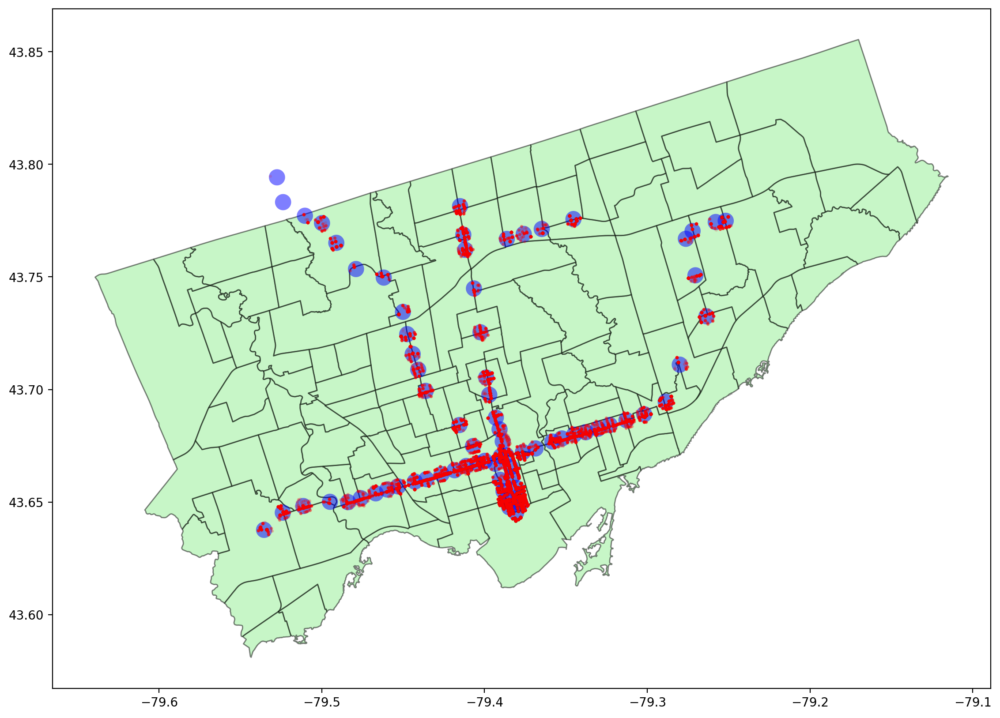

In [45]:
ax = neighborhoods.plot(color = 'lightgreen', edgecolor = 'black', alpha = 0.5)
stations_area.plot(ax=ax, color = 'blue', markersize = 3, alpha = 0.5)
crime_around_stations.plot(ax=ax, color = 'red', markersize = 3, alpha = 0.1)

<AxesSubplot:>

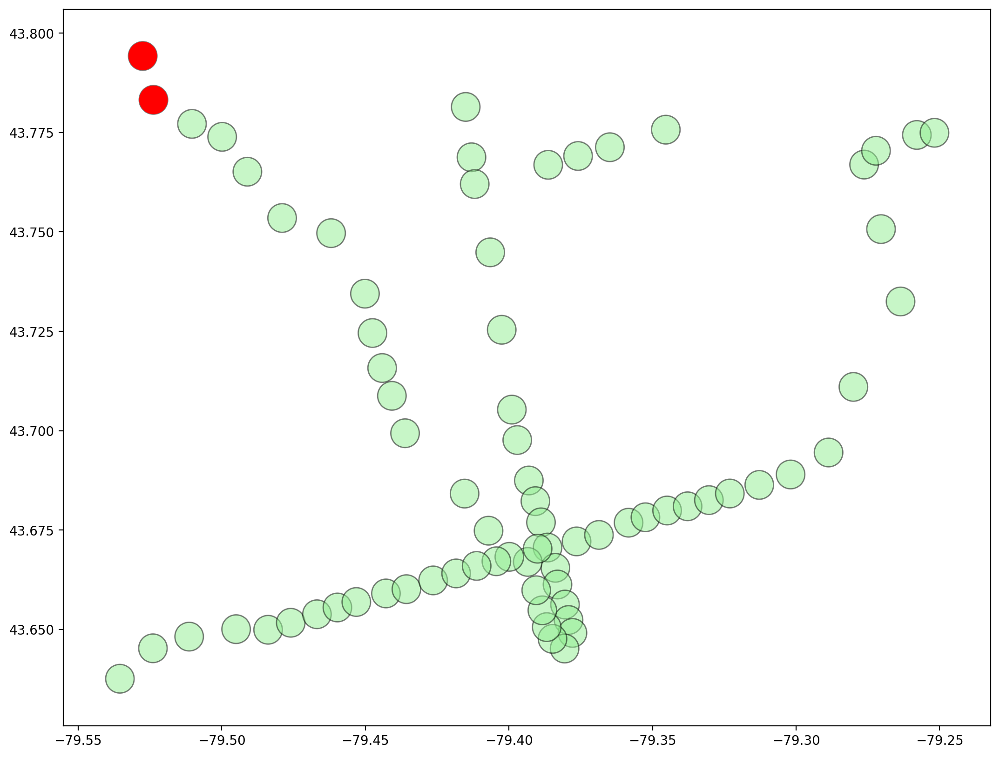

In [46]:
# checking there are actually crime around the 2 stations outside the neighbourhoods
ax = stations_area.plot(color = 'lightgreen', edgecolor = 'black', alpha = 0.5)
stations_area[(stations_area['station'] == 'highway 407') | (stations_area['station'] == 'vaughan metropolitan centre')].plot(ax=ax, color = 'red', markersize = 3)

In [47]:
gpd.sjoin(mci_point, stations_area[(stations_area['station'] == 'highway 407') | (stations_area['station'] == 'vaughan metropolitan centre')],
          op='intersects')

C:\Users\willi\miniconda3\envs\police\lib\site-packages\IPython\core\interactiveshell.py:3309: FutureWarning:

The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.



,X,Y,Index_,event_unique_id,Division,occurrencedate,reporteddate,premisetype,ucr_code,ucr_ext,...,distance_km_order,commute_time_order,url,station,line,order,longitude,latitude,commute_time,distance_km
230404,-8.853438e+06,5.433740e+06,233332,GO-20143349474,NSA,2014-11-08 05:00:00+00:00,2014/11/22 05:00:00+00,Outside,2135,210,...,74,64,https://www.ttc.ca/subway-stations/vaughan-met...,vaughan metropolitan centre,Line 1 Yonge-University,37,-79.527487,43.794244,44,18.050992


In [48]:
crime_around_stations.groupby('station')['event_unique_id'].count().sort_values(ascending=False)

station
dundas                         4856
college                        3633
queen                          3583
wellesley                      2983
bloor yonge                    2461
                               ... 
ellesmere                        83
old mill                         56
pioneer village                  53
downsview park                   42
vaughan metropolitan centre       1
Name: event_unique_id, Length: 74, dtype: int64